In [170]:
import pandas as pd
import seaborn as sns
import numpy as np
import os.path as op
import glob
import matplotlib.pyplot as plt
import ast
# import moss
import csv
import random
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
import scipy
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm

from statsmodels.stats.anova import AnovaRM


In [171]:
df = pd.read_csv('pilot5_shuffled_nonresp_inc_ltm.csv')
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns


In [172]:
# df['Prioritized - Deprioritized IT Distractor Similarity'] = pd.Categorical(
#     df['Prioritized - Deprioritized IT Distractor Similarity'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )

# df['Prioritized - Deprioritized V2 Distractor Similarity'] = pd.Categorical(
#     df['Prioritized - Deprioritized V2 Distractor Similarity'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )
# df['V2 Distractor Similarity\nto Prioritized Item'] = pd.Categorical(
#     df['V2 Distractor Similarity\nto Prioritized Item'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )
# df['IT Distractor Similarity\nto Prioritized Item'] = pd.Categorical(
#     df['IT Distractor Similarity\nto Prioritized Item'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )
# df['V2 Distractor Similarity\nto Derioritized Item'] = pd.Categorical(
#     df['Prioritized - Deprioritized V2 Distractor Similarity'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )
# df['IT Distractor Similarity\nto Derioritized Item'] = pd.Categorical(
#     df['Prioritized - Deprioritized V2 Distractor Similarity'],
#     categories=['Least Similar', '', ' ', '   ', 'Most Similar'],
#     ordered=True
# )

In [173]:
df['Prioritized - Deprioritized IT Distractor Similarity'] 

0                     
1                     
2                  NaN
3         Most Similar
4                     
             ...      
40195              NaN
40196                 
40197    Least Similar
40198                 
40199              NaN
Name: Prioritized - Deprioritized IT Distractor Similarity, Length: 40200, dtype: object

In [174]:
def remove_unit_variance(df, col, unit, group=None, suffix="_within"):
    """Remove variance between sampling units.

    This is useful for plotting repeated-measures data using within-unit
    error bars.

    Parameters
    ----------
    df : DataFrame
        Input data. Will have a new column added.
    col : column name
        Column in dataframe with quantitative measure to modify.
    unit : column name
        Column in dataframe defining sampling units (e.g., subjects).
    group : column name(s), optional
        Columns defining groups to remove unit variance within.
    suffix : string, optional
        Suffix appended to ``col`` name to create new column.

    Returns
    -------
    df : DataFrame
        Returns modified dataframe.

    """
    new_col = col + suffix

    def demean(x):
        return x - x.mean()

    if group is None:
        new = df.groupby(unit)[col].transform(demean)
        new += df[col].mean()
        df.loc[:, new_col] = new
    else:
        df.loc[:, new_col] = np.nan
        for level, df_level in df.groupby(group):
            new = df_level.groupby(unit)[col].transform(demean)
            new += df_level[col].mean()
            df.loc[new.index, new_col] = new

    return df

In [175]:
df = remove_unit_variance(df,'mouse.time_last','participant')
df['analysis_rt'] = df['mouse.time_last_within']

In [176]:
palette = sns.color_palette("husl", n_colors=2)[::-1]  # Reverse the color order


In [177]:
# df['IT Distractor Similarity\nto Prioritized Item']

In [178]:
df['Distractor V2 Similarity Preference'] = df['v2_prefers'] 
df['Distractor IT Similarity Preference'] = df['it_prefers']


column_params = {
    'v2': {'n_cats': 5, 'labels': ['Least Similar', '', ' ', '   ', 'Most Similar']},
    'it': {'n_cats': 5, 'labels': ['Least Similar', '', ' ', '   ', 'Most Similar']}
}

for label in ['it_sim_dis_attend', 'v2_sim_dis_attend', 'it_sim_dis_unattend', 'v2_sim_dis_unattend', 'it_sim_dis_diff', 'v2_sim_dis_diff','v2_sim_dis_diff_sq', 'it_sim_dis_diff_sq']:
    
    if 'v2' in label:
        n_cats = column_params['v2']['n_cats']
        labels = column_params['v2']['labels']
    else:
        n_cats = column_params['it']['n_cats']
        labels = column_params['it']['labels']
    
    df[label + '_cat'] = pd.qcut(df[label], q=n_cats, labels=labels, duplicates='drop')


df['V2 Distractor Similarity\nto Prioritized Item'] = df['v2_sim_dis_attend_cat']
df['IT Distractor Similarity\nto Prioritized Item'] = df['it_sim_dis_attend_cat']
df['V2 Distractor Similarity\nto Deprioritized Item'] = df['v2_sim_dis_unattend_cat']
df['IT Distractor Similarity\nto Deprioritized Item'] = df['it_sim_dis_unattend_cat']
df['Prioritized - Deprioritized IT Distractor Similarity'] = df['it_sim_dis_diff_cat'] 
df['Prioritized - Deprioritized V2 Distractor Similarity'] = df['v2_sim_dis_diff_cat'] 
df['Prioritized - Deprioritized IT Distractor Similarity Squared'] = df['v2_sim_dis_diff_sq_cat'] 
df['Prioritized - Deprioritized V2 Distractor Similarity Squared'] = df['it_sim_dis_diff_sq_cat'] 


In [179]:
df['it_sim_dis_diff'] = df['it_sim_dis_diff'] - np.mean(df['it_sim_dis_diff'])
df['v2_sim_dis_diff'] = df['v2_sim_dis_diff'] - np.mean(df['v2_sim_dis_diff'])

df['it_sim_dis_diff_sq'] = [x**2 for x in df['it_sim_dis_diff']]
df['v2_sim_dis_diff_sq'] = [x**2 for x in df['v2_sim_dis_diff']]

df['it_sim_dis_diff_sq'] = df['it_sim_dis_diff_sq'] - np.mean(df['it_sim_dis_diff_sq'])
df['v2_sim_dis_diff_sq'] = df['v2_sim_dis_diff_sq'] - np.mean(df['v2_sim_dis_diff_sq'])


df['IT_diff_binned'] = pd.qcut(df['it_sim_dis_diff'], 5, duplicates='drop')
df['V2_diff_binned'] = pd.qcut(df['v2_sim_dis_diff'], 5, duplicates='drop')
df['IT_diff_binned_sq'] = pd.qcut(df['it_sim_dis_diff_sq'], 5, duplicates='drop')
df['V2_diff_binned_sq'] = pd.qcut(df['v2_sim_dis_diff_sq'], 5, duplicates='drop')

def round_to_significant_figures(x, sig_figs=2):
    if x == 0:
        return 0
    else:
        return round(x, sig_figs - int(np.floor(np.log10(abs(x)))) - 1)


def process_interval(interval):
    # Round both bounds
    lower_rounded = round_to_significant_figures(interval.left)
    upper_rounded = round_to_significant_figures(interval.right)
    # Return a new interval with the rounded bounds
    return pd.Interval(lower_rounded, upper_rounded)

df['IT_diff_binned'] = df['IT_diff_binned'].apply(process_interval)
df['V2_diff_binned'] = df['V2_diff_binned'].apply(process_interval)
df['IT_diff_binned_sq'] = df['IT_diff_binned_sq'].apply(process_interval)
df['V2_diff_binned_sq'] = df['V2_diff_binned_sq'].apply(process_interval)

df['Prioritized - Deprioritized V2 Distractor Similarity Ranges'] = df['V2_diff_binned']
df['Prioritized - Deprioritized IT Distractor Similarity Ranges'] = df['IT_diff_binned']
df['Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges'] = df['V2_diff_binned_sq']
df['Prioritized - Deprioritized IT Distractor Similarity Squared Ranges'] = df['IT_diff_binned_sq']

In [180]:
# df = df.loc[:, ~df.columns.duplicated()]

# # Convert binary variables to categorical data types
# df['reliability_binary'] = df['reliability'].astype('category')
# df['validity_binary'] = df['validity'].astype('category')

# # Fit the generalized linear model (GLM) with binomial family
# md = smf.glm(
#     "Accuracy ~ it_sim_dis_diff * reliability_binary * validity_binary + v2_sim_dis_diff * reliability_binary * validity_binary",
#     data=df,
#     family=sm.families.Binomial()
# ).fit()

# # Display the model summary
# print(md.summary())

In [181]:



md = smf.glm(
    "resp_correct ~ it_sim_dis_diff*reliability_binary*validity_binary \
        + v2_sim_dis_diff*reliability_binary*validity_binary",
    data=df,
    family=sm.families.Binomial()  
).fit()

# View the summary
md.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:           resp_correct   No. Observations:                40200
Model:                            GLM   Df Residuals:                    40188
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -22297.
Date:                Wed, 13 Nov 2024   Deviance:                       44593.
Time:                        18:07:43   Pearson chi2:                 4.02e+04
No. Iterations:                     5   Pseudo R-squ. (CS):           0.007305
Covariance Type:            nonrobust                                         
======================================================================================================================
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
Intercept                                              0.9526      0.027     34.840      0.000       0.899       1.006
it_sim_dis_diff                                       -0.1480      0.037     -4.003      0.000      -0.220      -0.076
reliability_binary                                    -0.1923      0.046     -4.164      0.000      -0.283      -0.102
it_sim_dis_diff:reliability_binary                    -0.0147      0.063     -0.234      0.815      -0.138       0.108
validity_binary                                        0.1825      0.034      5.371      0.000       0.116       0.249
it_sim_dis_diff:validity_binary                        0.2829      0.046      6.137      0.000       0.193       0.373
reliability_binary:validity_binary                     0.3232      0.054      6.013      0.000       0.218       0.429
it_sim_dis_diff:reliability_binary:validity_binary    -0.0086      0.073     -0.118      0.906      -0.152       0.135
v2_sim_dis_diff                                       -0.7469      0.280     -2.672      0.008      -1.295      -0.199
v2_sim_dis_diff:reliability_binary                     1.0812      0.473      2.288      0.022       0.155       2.007
v2_sim_dis_diff:validity_binary                        1.2892      0.349      3.698      0.000       0.606       1.972
v2_sim_dis_diff:reliability_binary:validity_binary    -1.2422      0.551     -2.255      0.024      -2.322      -0.162
======================================================================================================================
"""

In [182]:


md = smf.glm(
    "Accuracy ~ it_sim_dis_diff*reliability_binary*validity_binary \
        + v2_sim_dis_diff*reliability_binary*validity_binary",
    data=df,
    family=sm.families.Binomial()  
).fit()

# View the summary
md.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               Accuracy   No. Observations:                40200
Model:                            GLM   Df Residuals:                    40188
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21720.
Date:                Wed, 13 Nov 2024   Deviance:                   1.3907e+05
Time:                        18:07:43   Pearson chi2:                 3.65e+04
No. Iterations:                     5   Pseudo R-squ. (CS):           0.007200
Covariance Type:            nonrobust                                         
======================================================================================================================
                                                         coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------
Intercept                                              0.9526      0.027     34.841      0.000       0.899       1.006
it_sim_dis_diff                                       -0.1409      0.037     -3.814      0.000      -0.213      -0.069
reliability_binary                                    -0.1923      0.046     -4.165      0.000      -0.283      -0.102
it_sim_dis_diff:reliability_binary                    -0.0220      0.063     -0.351      0.726      -0.145       0.101
validity_binary                                        0.1824      0.034      5.369      0.000       0.116       0.249
it_sim_dis_diff:validity_binary                        0.2771      0.046      6.012      0.000       0.187       0.367
reliability_binary:validity_binary                     0.3230      0.054      6.010      0.000       0.218       0.428
it_sim_dis_diff:reliability_binary:validity_binary    -0.0046      0.073     -0.063      0.950      -0.148       0.139
v2_sim_dis_diff                                       -0.8089      0.280     -2.893      0.004      -1.357      -0.261
v2_sim_dis_diff:reliability_binary                     1.0677      0.473      2.259      0.024       0.142       1.994
v2_sim_dis_diff:validity_binary                        1.3033      0.349      3.738      0.000       0.620       1.987
v2_sim_dis_diff:reliability_binary:validity_binary    -1.2593      0.551     -2.286      0.022      -2.339      -0.179
======================================================================================================================
"""

In [183]:
# df['v2_sim_dis_attend_cat']

In [184]:
# df['tested_item'] = df['Tested Item']
# df['ret_rel'] = df['Retrocue Reliability']

In [185]:
len(set(df['participant']))

134

In [186]:
df_correct = df[df['resp_correct'] == 1]


In [187]:
df

,setup_js.started,setup_js.stopped,participant,date,expName,psychopyVersion,OS,frameRate,Instructions1.started,Instructions1.stopped,...,v2_sim_dis_diff_sq_cat,it_sim_dis_diff_sq_cat,Prioritized - Deprioritized IT Distractor Similarity Squared,Prioritized - Deprioritized V2 Distractor Similarity Squared,IT_diff_binned_sq,V2_diff_binned_sq,Prioritized - Deprioritized V2 Distractor Similarity Ranges,Prioritized - Deprioritized IT Distractor Similarity Ranges,Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges,Prioritized - Deprioritized IT Distractor Similarity Squared Ranges
0,NaN,NaN,116851,2024-10-12 15:22:21.820,WM_Deepgen,2024.1.5,Win32,59.52381,NaN,NaN,...,,Least Similar,,Least Similar,"(-0.54, -0.44]","(0.0012, 0.0089]","(0.1, 0.17]","(-0.35, 0.25]","(0.0012, 0.0089]","(-0.54, -0.44]"
1,NaN,NaN,116851,2024-10-12 15:22:21.820,WM_Deepgen,2024.1.5,Win32,59.52381,NaN,NaN,...,Least Similar,Least Similar,Least Similar,Least Similar,"(-0.54, -0.44]","(-0.011, -0.0081]","(-0.041, 0.042]","(-0.35, 0.25]","(-0.011, -0.0081]","(-0.54, -0.44]"
2,NaN,NaN,116851,2024-10-12 15:22:21.820,WM_Deepgen,2024.1.5,Win32,59.52381,NaN,NaN,...,,,,,"(-0.25, 0.042]","(-0.0081, -0.0047]","(0.042, 0.1]","(-0.73, -0.35]","(-0.0081, -0.0047]","(-0.25, 0.042]"
3,NaN,NaN,116851,2024-10-12 15:22:21.820,WM_Deepgen,2024.1.5,Win32,59.52381,NaN,NaN,...,,Most Similar,,Most Similar,"(0.43, 0.91]","(-0.0081, -0.0047]","(-0.11, -0.041]","(0.83, 1.2]","(-0.0081, -0.0047]","(0.43, 0.91]"
4,NaN,NaN,116851,2024-10-12 15:22:21.820,WM_Deepgen,2024.1.5,Win32,59.52381,NaN,NaN,...,Most Similar,,Most Similar,,"(-0.25, 0.042]","(0.0089, 0.02]","(-0.17, -0.11]","(0.25, 0.83]","(0.0089, 0.02]","(-0.25, 0.042]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40195,NaN,NaN,167080,2024-10-28 17:42:43.597,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,Least Similar,,Least Similar,,"(-0.25, 0.042]","(-0.011, -0.0081]","(-0.041, 0.042]","(-0.73, -0.35]","(-0.011, -0.0081]","(-0.25, 0.042]"
40196,NaN,NaN,167080,2024-10-28 17:42:43.597,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,Least Similar,,Least Similar,"(-0.54, -0.44]","(-0.0081, -0.0047]","(0.042, 0.1]","(-0.35, 0.25]","(-0.0081, -0.0047]","(-0.54, -0.44]"
40197,NaN,NaN,167080,2024-10-28 17:42:43.597,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,,,,"(0.042, 0.43]","(0.0012, 0.0089]","(-0.17, -0.11]","(-1.2, -0.73]","(0.0012, 0.0089]","(0.042, 0.43]"
40198,NaN,NaN,167080,2024-10-28 17:42:43.597,WM_Deepgen,2023.2.1,MacIntel,62.50000,NaN,NaN,...,,,,,"(-0.44, -0.25]","(0.0012, 0.0089]","(0.1, 0.17]","(0.25, 0.83]","(0.0012, 0.0089]","(-0.44, -0.25]"


<Figure size 1000x600 with 0 Axes>

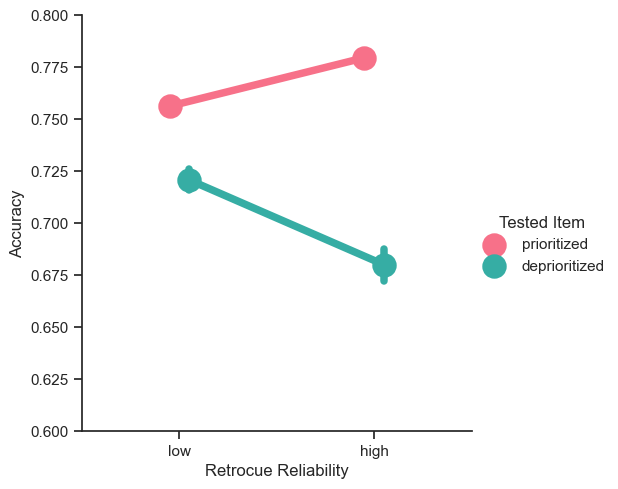

In [188]:

plt.figure(figsize=(10, 6))
sns.catplot(
    x='Retrocue Reliability',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    order = ['low','high'],
#     col = 'participant',
    kind = 'point',
    hue='Tested Item',
    dodge=0.1,
    palette=palette[::-1],  # Use the single-color palette
    data=df
)
plt.ylim(0.6, 0.8)
plt.ylabel('Accuracy')
# plt.xlabel('V2 Distractor Similarity to Prioritized Item')
# plt.title('Accuracy by V2 Distractor Similarity')
plt.show()


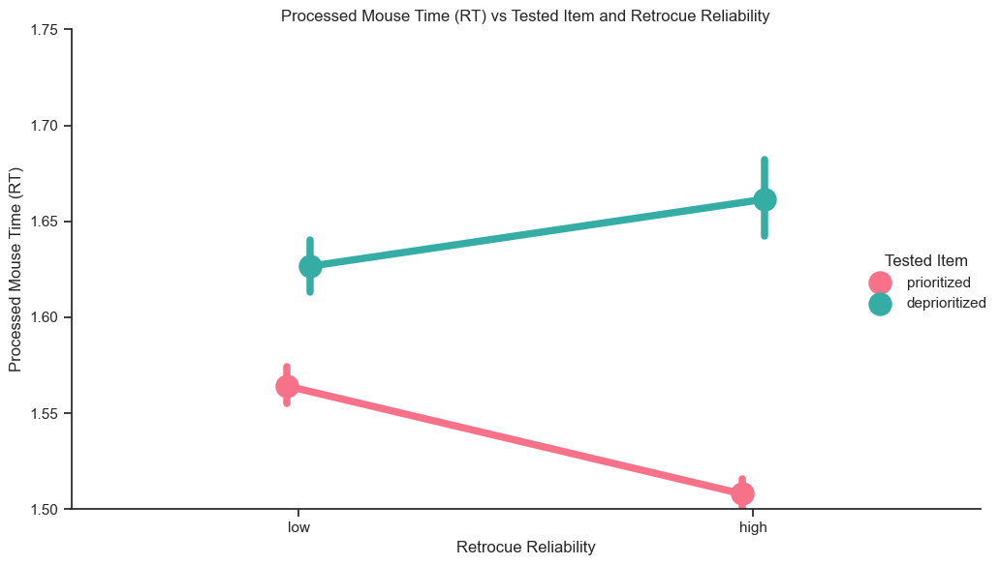

In [189]:
g = sns.catplot(x='Retrocue Reliability', y='analysis_rt', hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            order=['low', 'high'],  # Specify the order of the categories
            palette = palette[::-1])
g.set(ylim=(1.5, 1.75))

plt.xlabel('Retrocue Reliability')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Tested Item and Retrocue Reliability')
plt.tight_layout()
plt.show()

In [190]:
# df['V2 Distractor Similarity\nto Prioritized Item']

In [191]:
# nan_values = df['V2 Distractor Similarity\nto Prioritized Item'].isna()
# rows_with_nan = df[nan_values]
# print(rows_with_nan)


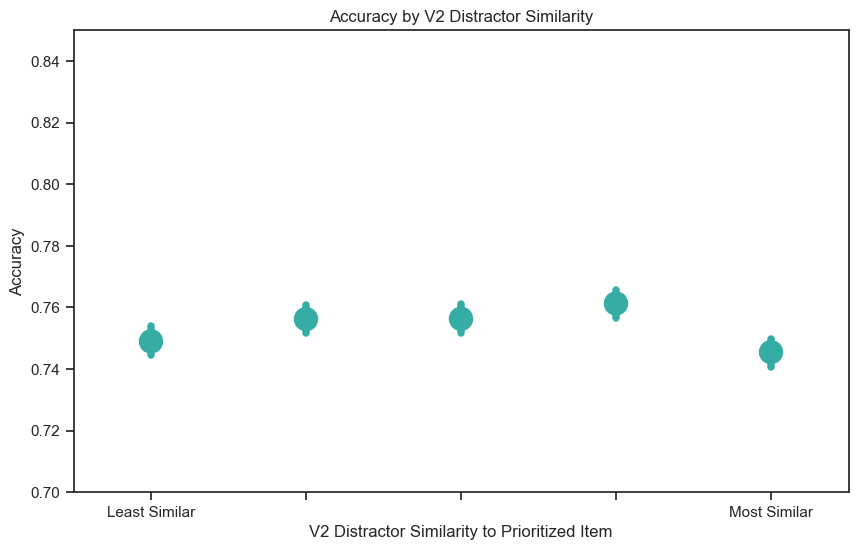

In [192]:
single_color = palette[0]  # Use the first color from the palette
single_color_palette = [single_color]

plt.figure(figsize=(10, 6))
sns.pointplot(
    x='V2 Distractor Similarity\nto Prioritized Item',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.7, 0.85)
plt.ylabel('Accuracy')
plt.xlabel('V2 Distractor Similarity to Prioritized Item')
plt.title('Accuracy by V2 Distractor Similarity')
plt.show()


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1190682690.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(50.318749999999994, 0.5, 'Accuracy')

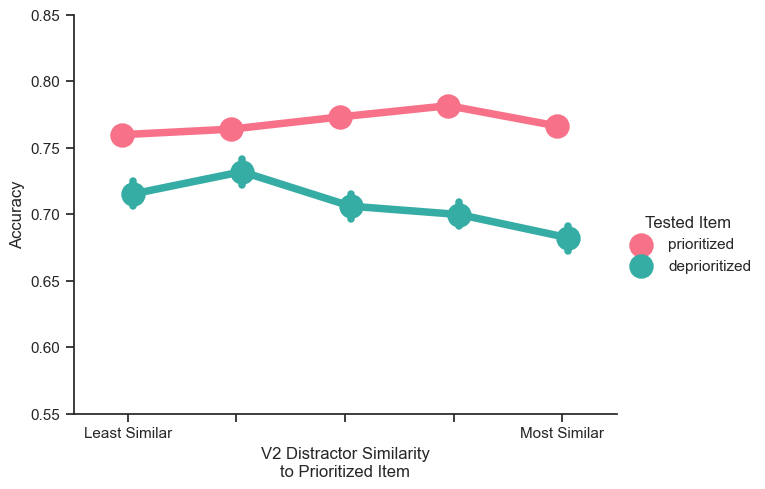

In [193]:
g = sns.catplot(
            x = 'V2 Distractor Similarity\nto Prioritized Item',
            y = 'Accuracy',
            ci = 68,
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.ylabel('Accuracy')


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1289384816.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(52.55651709401708, 0.5, 'Accuracy')

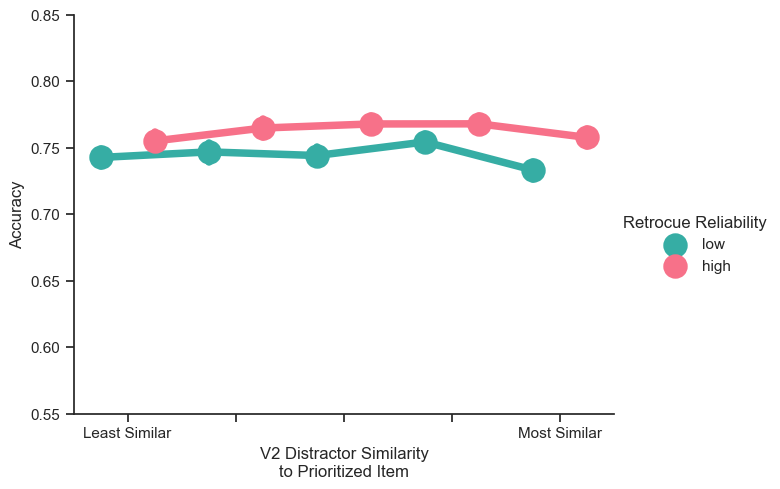

In [194]:
g = sns.catplot(
            x = 'V2 Distractor Similarity\nto Prioritized Item',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.5,
            kind = 'point',
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.ylabel('Accuracy')


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3059318271.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


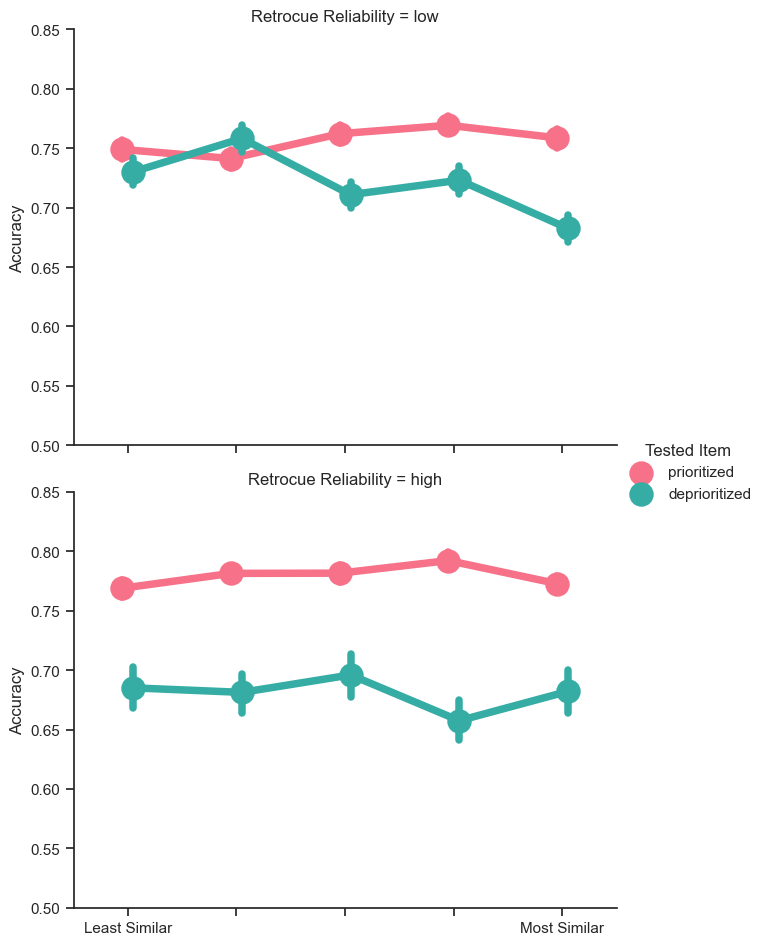

In [195]:
g = sns.catplot(
    x='V2 Distractor Similarity\nto Prioritized Item',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    dodge=0.1,
    kind='point',
    row_order = ['low', 'high'],
    palette=palette[::-1],  # Reverse the color order
    data=df
)
g.set(ylim=(0.50, 0.85))
g.set_axis_labels("", "Accuracy")

plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3108638688.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


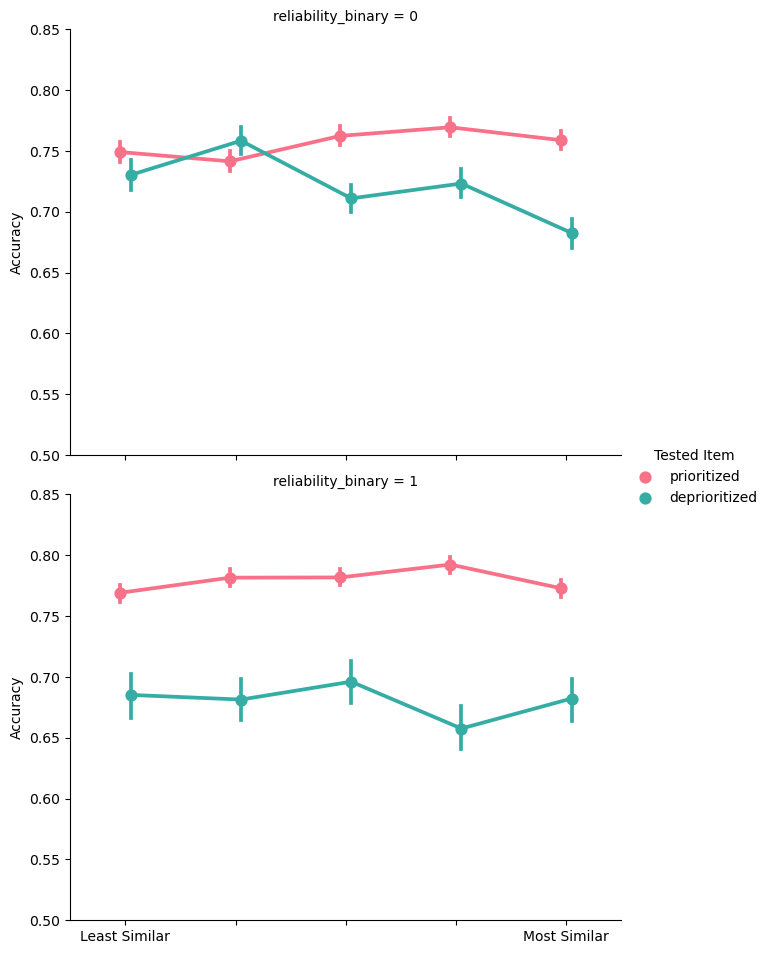

In [27]:
g = sns.catplot(
    x='V2 Distractor Similarity\nto Prioritized Item',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='reliability_binary',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    dodge=0.1,
    kind='point',
#     row_order = ['low', 'high'],
    palette=palette[::-1],  # Reverse the color order
    data=df
)
g.set(ylim=(0.50, 0.85))
g.set_axis_labels("", "Accuracy")

plt.show()

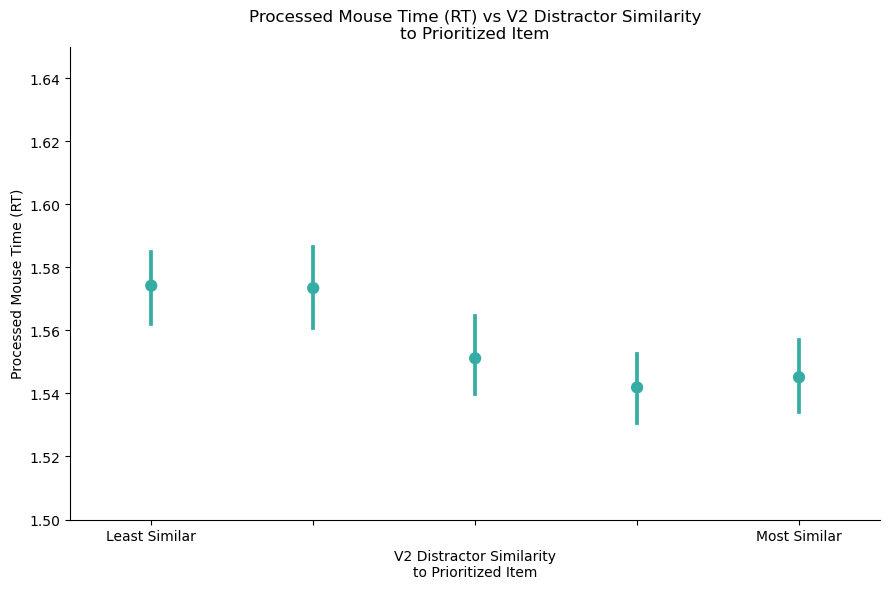

In [28]:
g = sns.catplot(x='V2 Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.65))

plt.xlabel('V2 Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

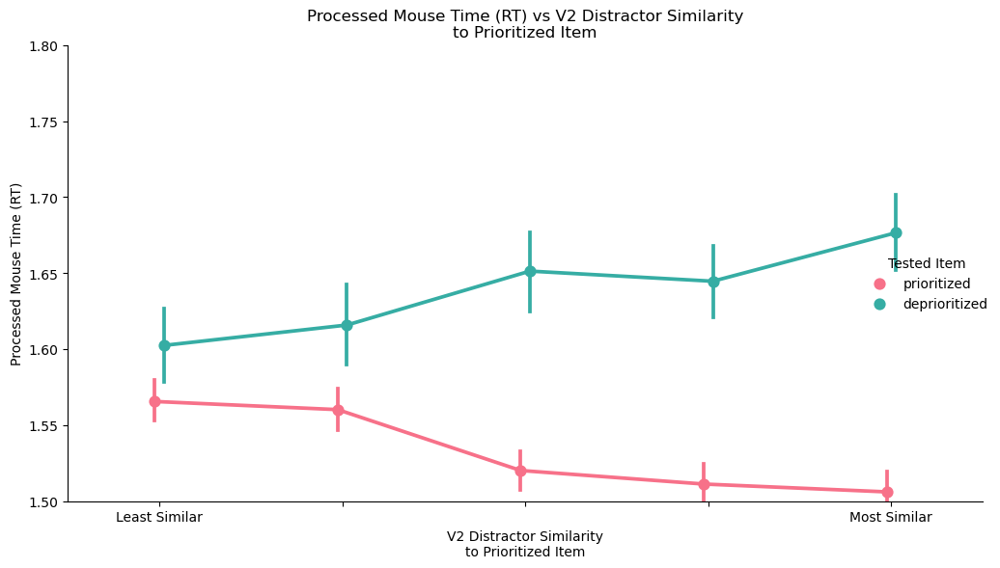

In [29]:
g = sns.catplot(x='V2 Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.5, 1.8))

plt.xlabel('V2 Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

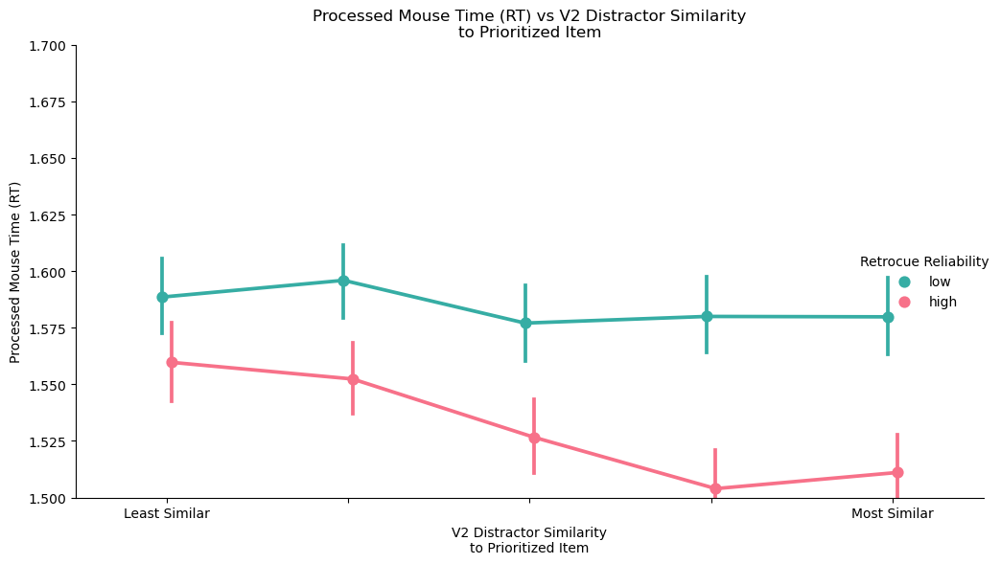

In [30]:
g = sns.catplot(x='V2 Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.7))

plt.xlabel('V2 Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

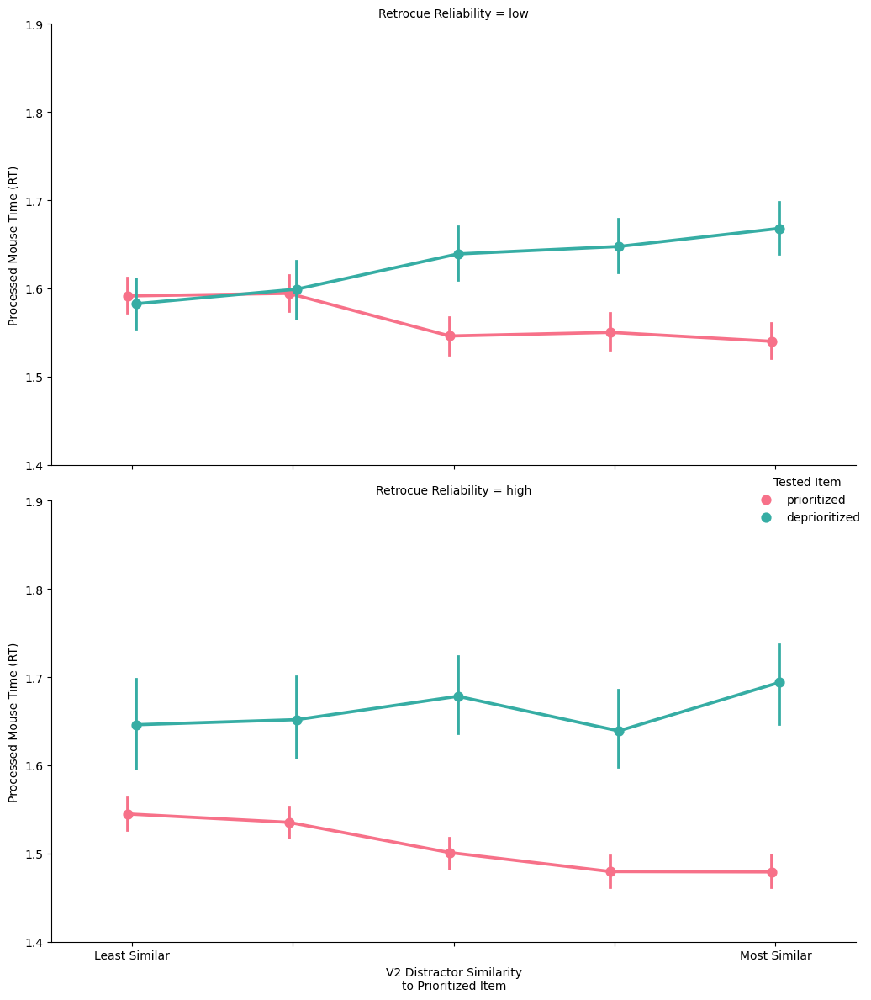

In [31]:
g = sns.catplot(x='V2 Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Tested Item', row='Retrocue Reliability',  # Use 'row' instead of 'col'
                kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
                palette=palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.9))

g.set_axis_labels('V2 Distractor Similarity\nto Prioritized Item', 'Processed Mouse Time (RT)')
plt.tight_layout()
plt.show()

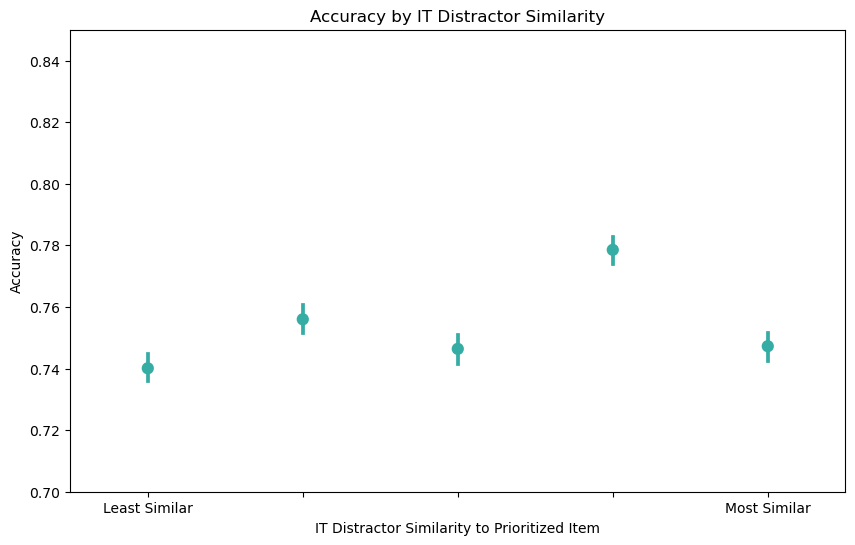

In [32]:


plt.figure(figsize=(10, 6))
sns.pointplot(
    x='IT Distractor Similarity\nto Prioritized Item',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.7, 0.85)
plt.ylabel('Accuracy')
plt.xlabel('IT Distractor Similarity to Prioritized Item')
plt.title('Accuracy by IT Distractor Similarity')
plt.show()


In [33]:
df['validity_binary'] = df['Tested Item'].apply(lambda x: 1 if x == 'prioritized' else 0)
df['reliability_binary'] = df['Retrocue Reliability'].apply(lambda x: 1 if x == 'high' else 0)


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2234716875.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


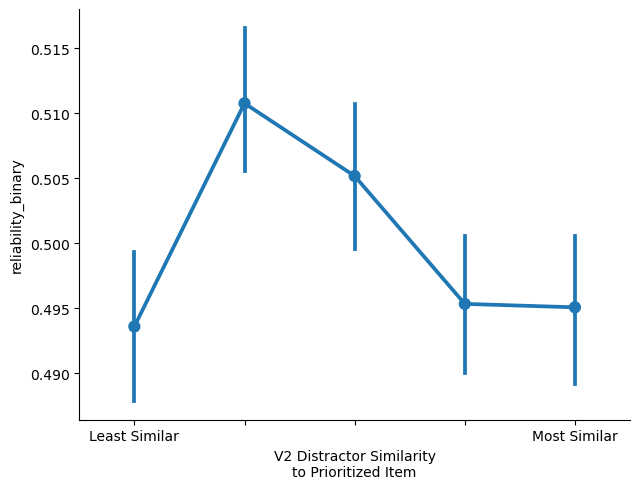

In [34]:

# plt.figure(figsize=(10, 6))
# sns.pointplot(
#     x='IT Distractor Similarity\nto Prioritized Item',
#     y='Tested Item',
#     errorbar=('ci', 68),  # Updated error bar parameter
#     dodge=0.5,
#     palette=single_color_palette,  # Use the single-color palette
#     data=df
# )
# plt.ylim(0.7, 0.85)
# plt.ylabel('Accuracy')
# plt.xlabel('IT Distractor Similarity to Prioritized Item')
# plt.title('Accuracy by IT Distractor Similarity')
# plt.show()



g = sns.catplot(
    x='V2 Distractor Similarity\nto Prioritized Item',
    y='reliability_binary',
    ci=68,
#     hue='Tested Item',
#     row='Retrocue Reliability',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    dodge=0.1,
    kind='point',
    row_order = ['low', 'high'],
#     palette=palette,  # Reverse the color order
    data=df)


plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2990378629.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

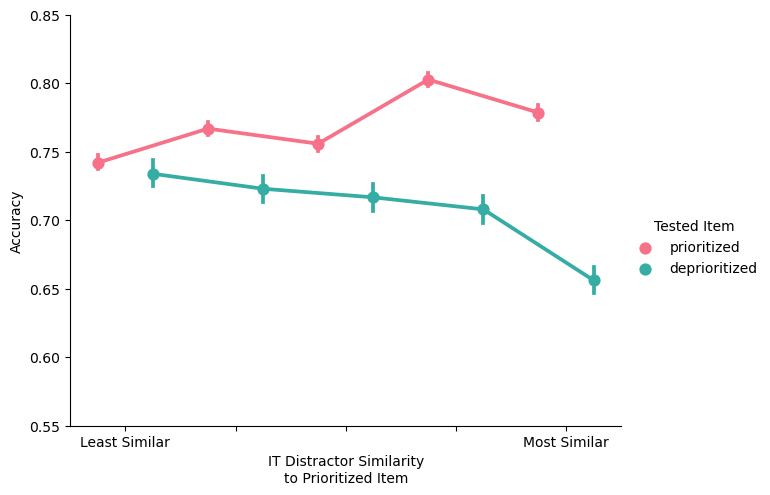

In [35]:
g = sns.catplot(
            x = 'IT Distractor Similarity\nto Prioritized Item',
            y = 'Accuracy',
            ci = 68,
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.5,
            kind = 'point',
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2304160147.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.877985517568845, 0.5, 'Accuracy')

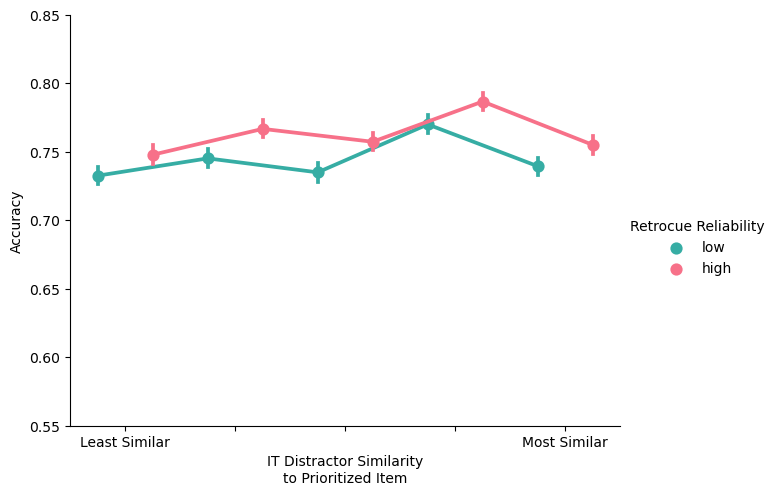

In [36]:
g = sns.catplot(
            x = 'IT Distractor Similarity\nto Prioritized Item',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.5,
            kind = 'point',
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2385623800.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


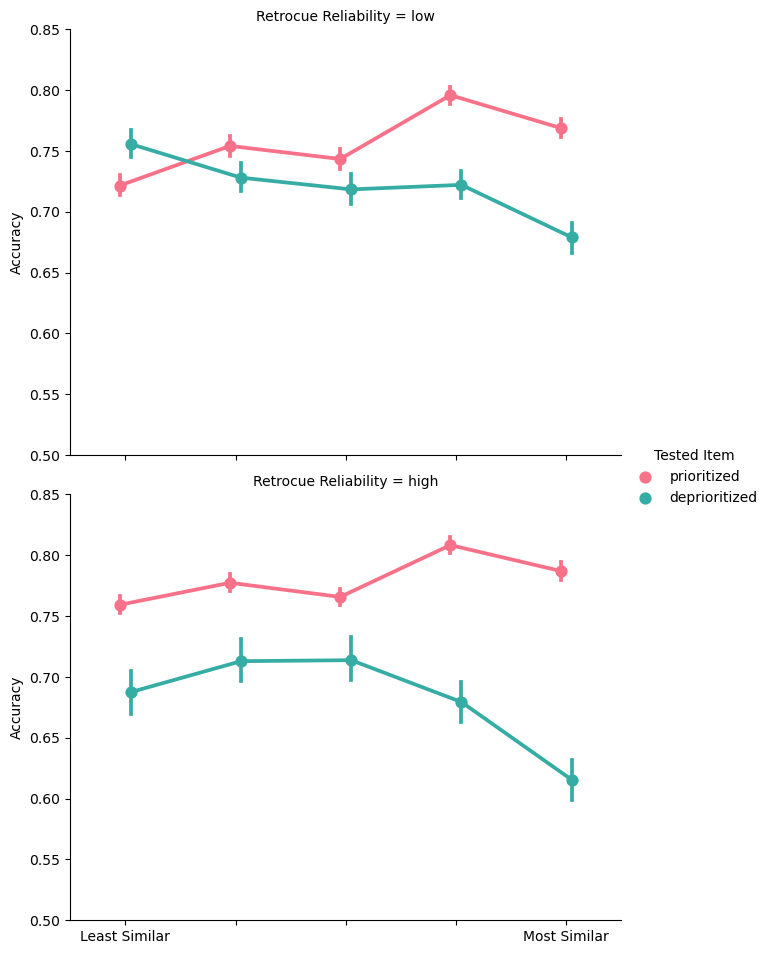

In [37]:
g = sns.catplot(
    x='IT Distractor Similarity\nto Prioritized Item',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    
    row='Retrocue Reliability',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Reverse the color order
    data=df
)
g.set(ylim=(0.5, 0.85))
g.set_axis_labels("", "Accuracy")

plt.show()

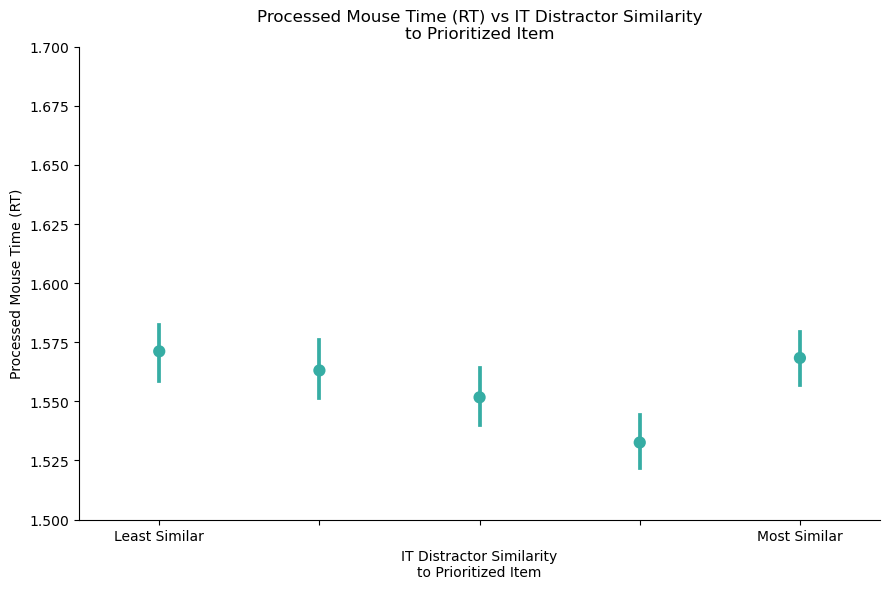

In [38]:
g = sns.catplot(x='IT Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.7))

plt.xlabel('IT Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs IT Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

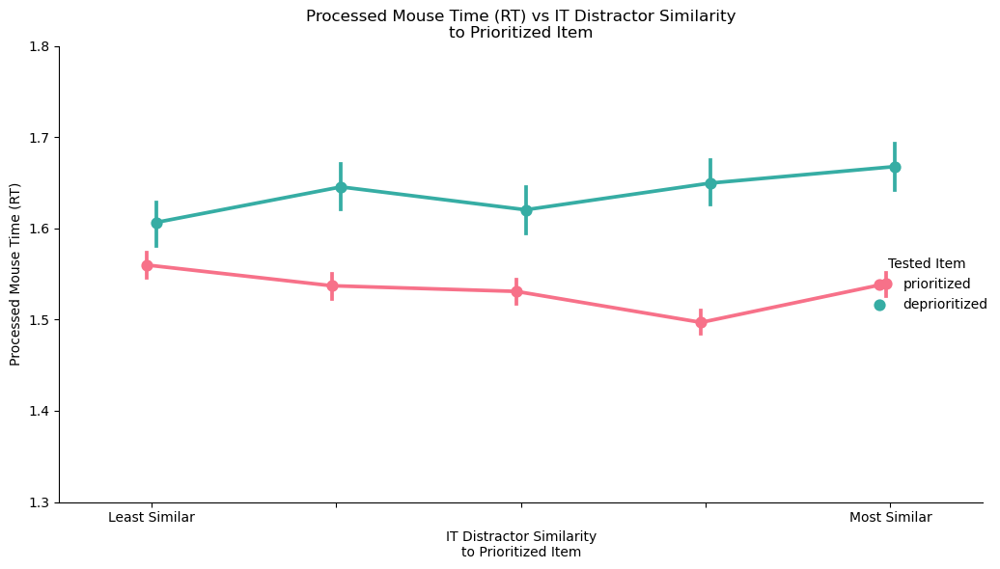

In [39]:
g = sns.catplot(x='IT Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.3, 1.8))

plt.xlabel('IT Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs IT Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

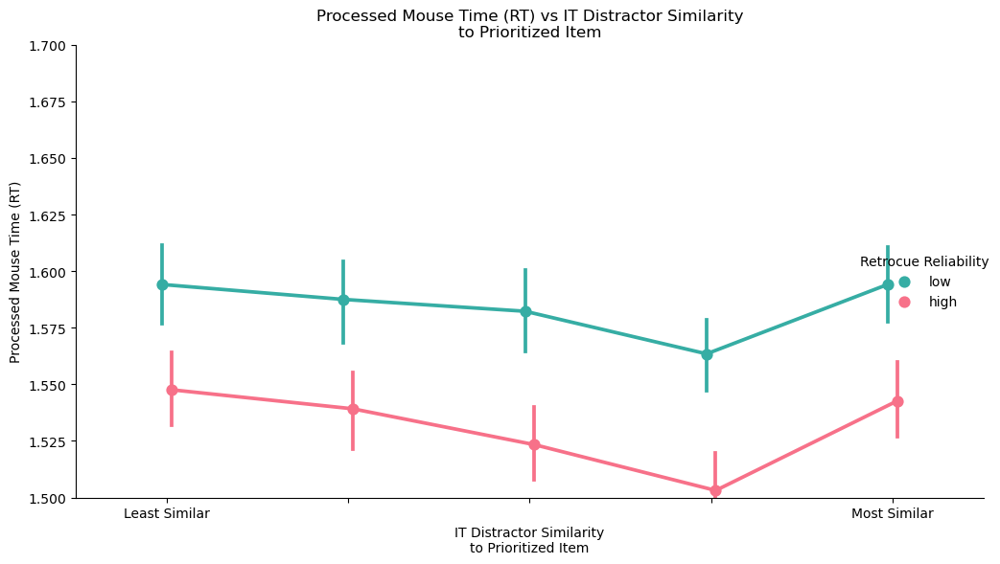

In [40]:
g = sns.catplot(x='IT Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.7))

plt.xlabel('IT Distractor Similarity\nto Prioritized Item')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs IT Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()

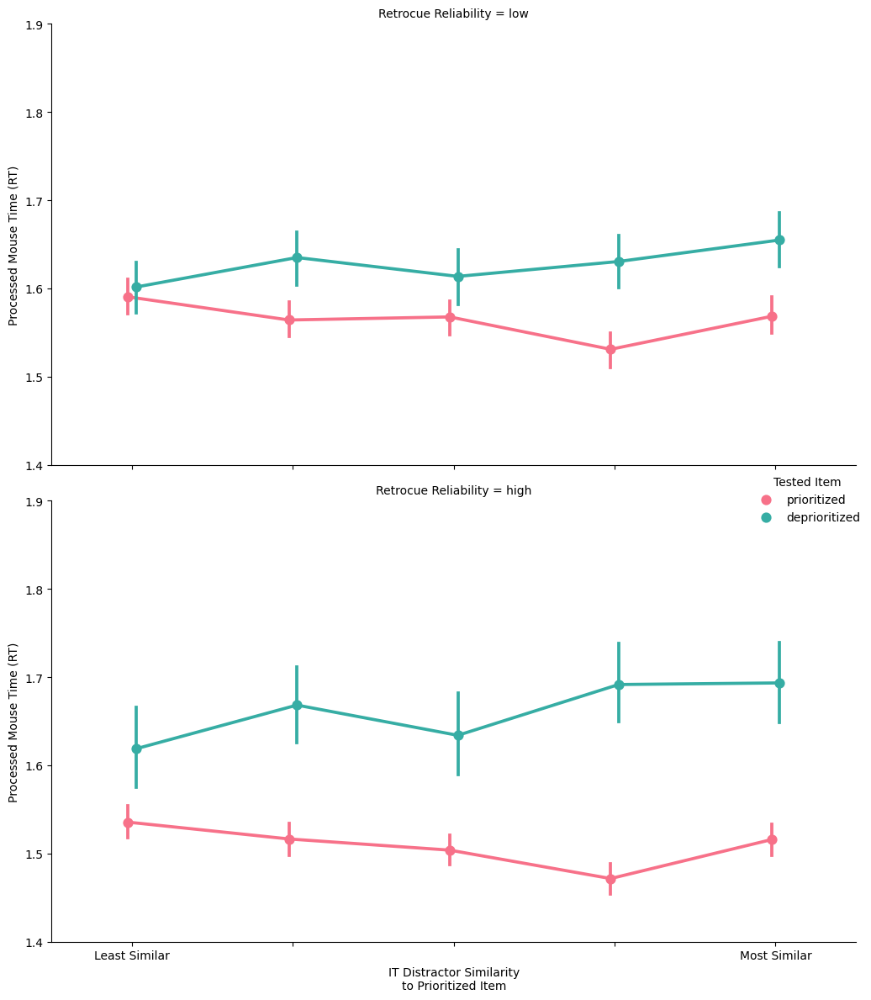

In [41]:
g = sns.catplot(x='IT Distractor Similarity\nto Prioritized Item', y='analysis_rt', 
                hue='Tested Item', row='Retrocue Reliability',  # Use 'row' instead of 'col'
                kind='point',row_order = ['low', 'high'], data=df_correct, dodge=True, height=6, aspect=1.5, 
                palette=palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.9))

g.set_axis_labels('IT Distractor Similarity\nto Prioritized Item', 'Processed Mouse Time (RT)')
plt.tight_layout()
plt.show()

In [42]:
# df['IT_diff_binned'] = pd.qcut(df['it_sim_dis_diff'], 5, duplicates='drop')
# df['V2_diff_binned'] = pd.qcut(df['v2_sim_dis_diff'], 5, duplicates='drop')

# def round_to_significant_figures(x, sig_figs=2):
#     if x == 0:
#         return 0
#     else:
#         return round(x, sig_figs - int(np.floor(np.log10(abs(x)))) - 1)


# def process_interval(interval):
#     # Round both bounds
#     lower_rounded = round_to_significant_figures(interval.left)
#     upper_rounded = round_to_significant_figures(interval.right)
#     # Return a new interval with the rounded bounds
#     return pd.Interval(lower_rounded, upper_rounded)

# df['IT_diff_binned'] = df['IT_diff_binned'].apply(process_interval)
# df['V2_diff_binned'] = df['V2_diff_binned'].apply(process_interval)

# df['Prioritized - Deprioritized V2 Distractor Similarity Ranges'] = df['V2_diff_binned']
# df['Prioritized - Deprioritized IT Distractor Similarity Ranges'] = df['IT_diff_binned']

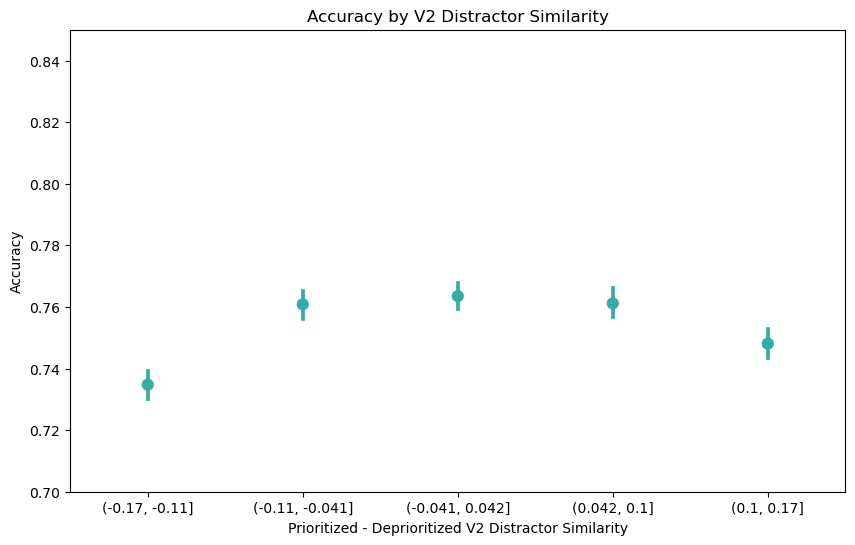

In [43]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='V2_diff_binned',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.7, 0.85)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity')
plt.title('Accuracy by V2 Distractor Similarity')
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/741286795.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

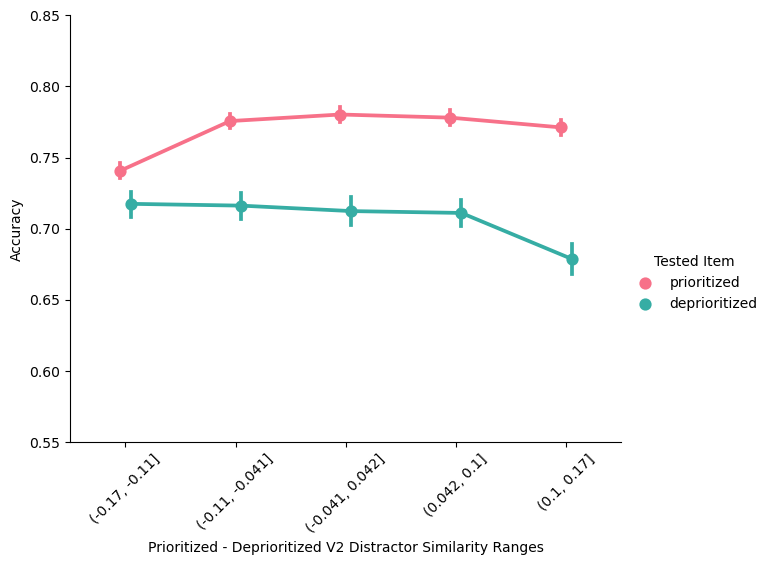

In [44]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1754270446.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.877985517568845, 0.5, 'Accuracy')

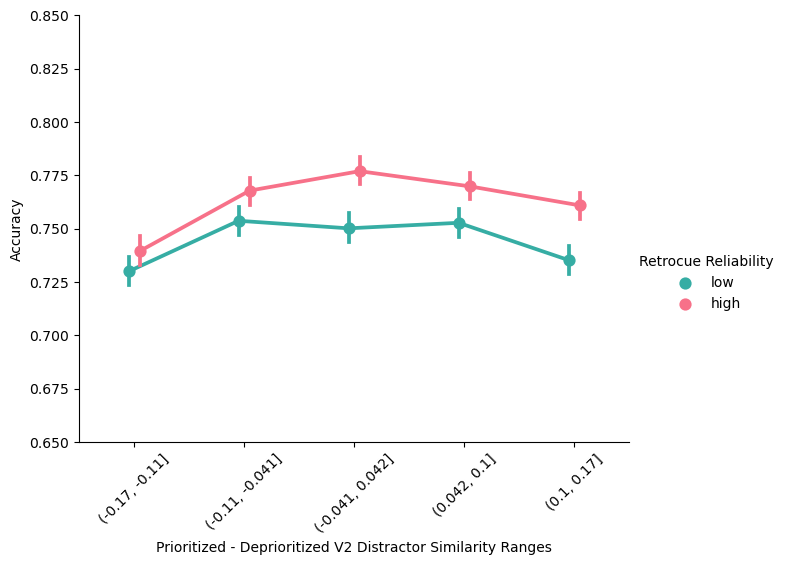

In [45]:



g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.65, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')



/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1572650511.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


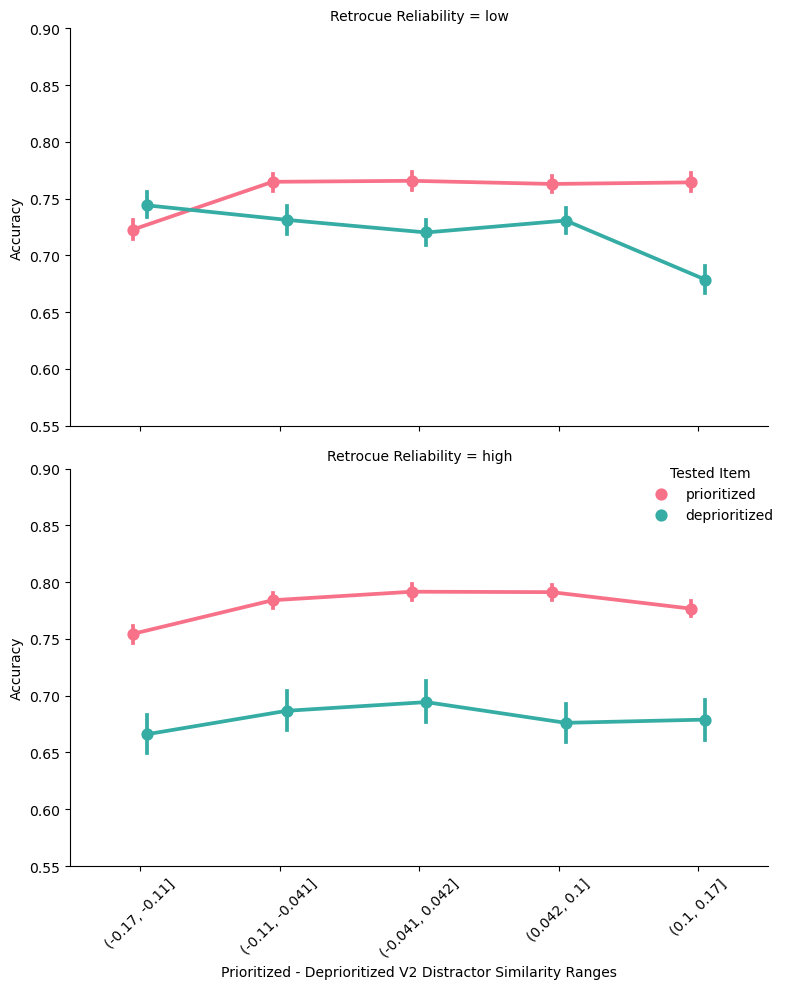

In [46]:


g = sns.catplot(
    x='Prioritized - Deprioritized V2 Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized V2 Distractor Similarity Ranges", "Accuracy")
plt.tight_layout()
plt.show()

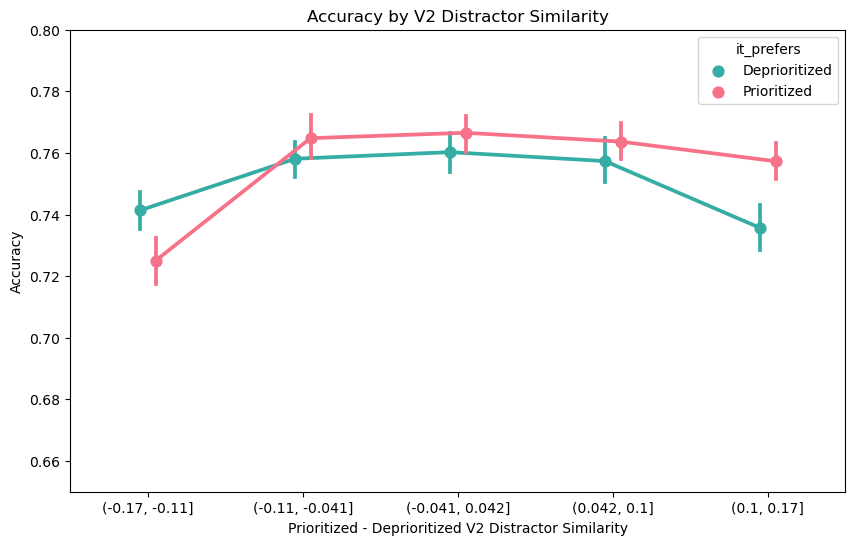

In [47]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='V2_diff_binned',
    y='Accuracy',
    hue = 'it_prefers',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.65, 0.8)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity')
plt.title('Accuracy by V2 Distractor Similarity')
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2612231446.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

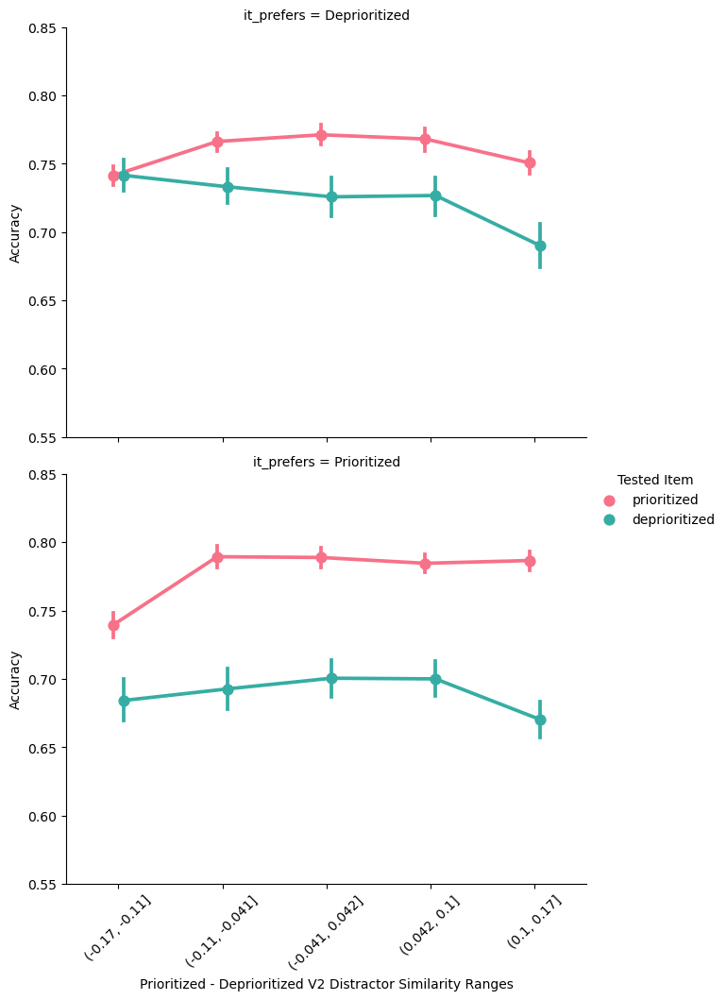

In [48]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            row = 'it_prefers',
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

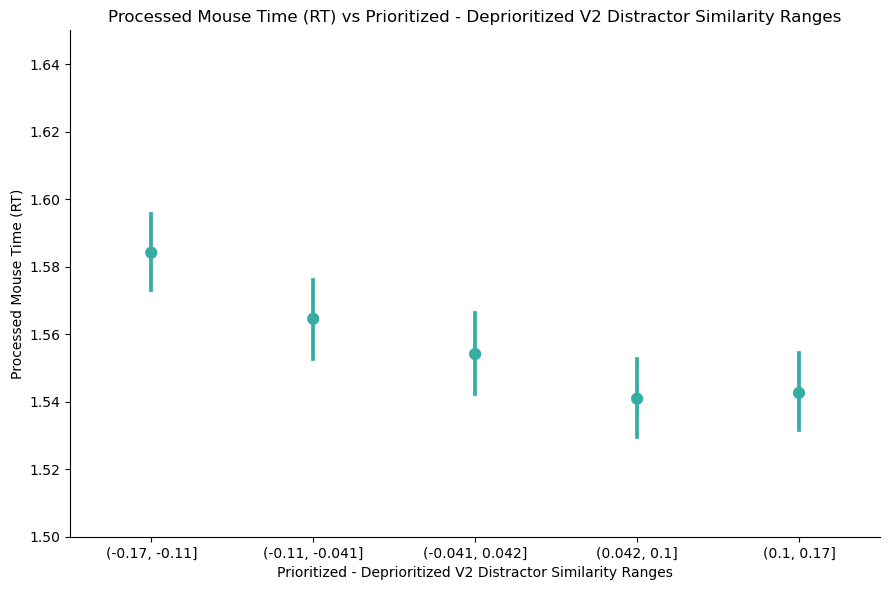

In [49]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Ranges', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.65))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

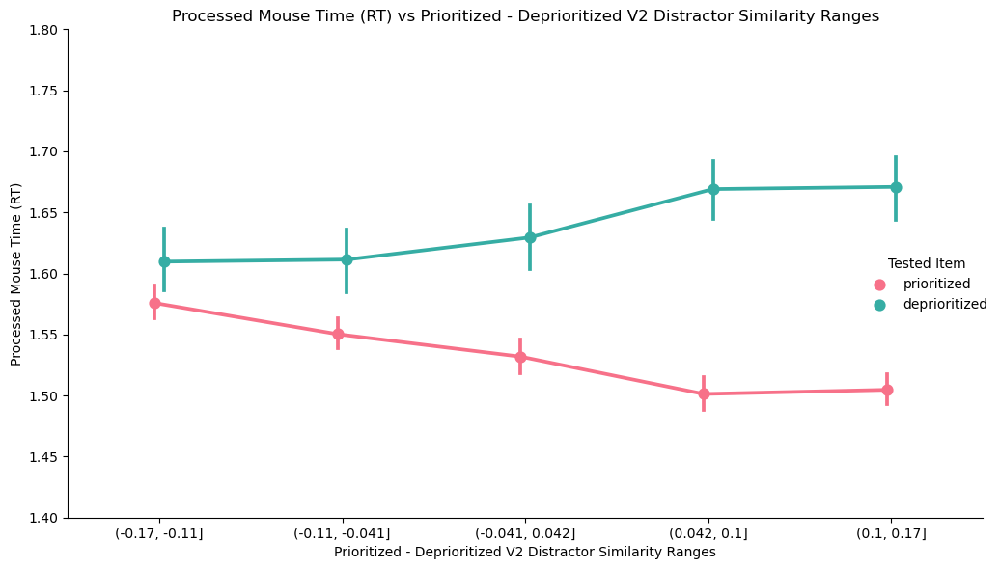

In [50]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Ranges', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.8))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

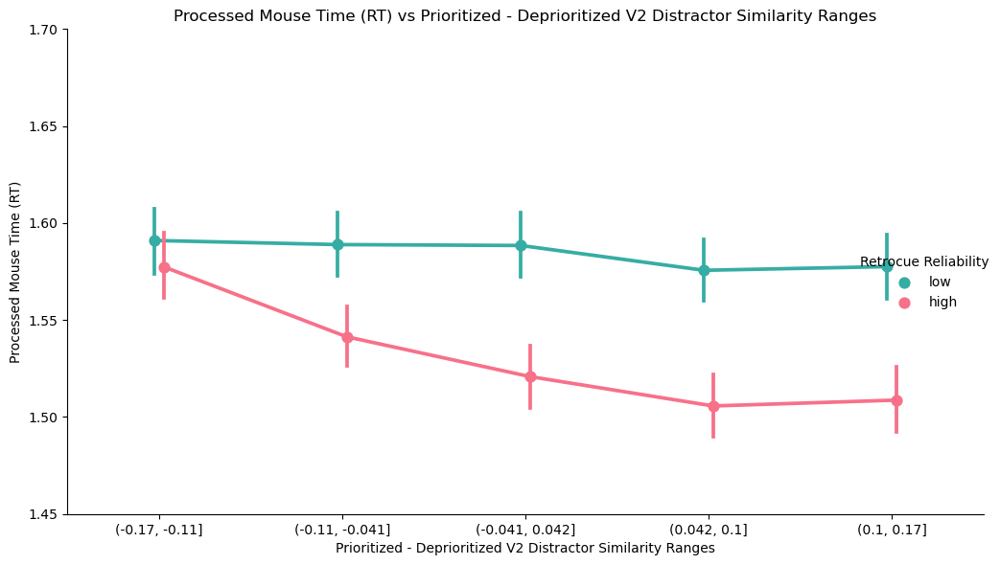

In [51]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Ranges', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.45, 1.7))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized V2 Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

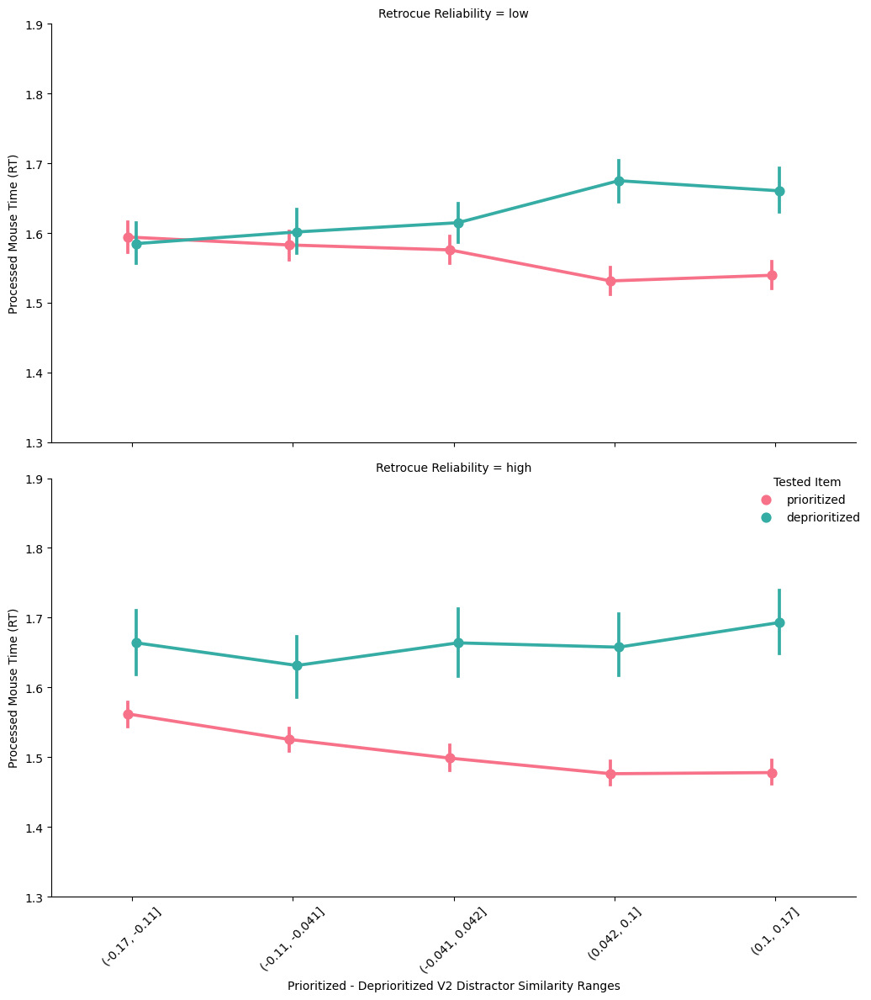

In [52]:
g = sns.catplot(
    x='Prioritized - Deprioritized V2 Distractor Similarity Ranges',
    y='analysis_rt',
    row='Retrocue Reliability',
    hue='Tested Item',  # Use 'row' instead of 'col'
    kind='point',
    row_order = ['low', 'high'],
    data=df_correct,
    dodge=True,
    height=6,
    aspect=1.5,
    palette=palette[::-1]  # Use the reversed color order
)
g.set(ylim=(1.3, 1.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    ax.set_xlabel('Prioritized - Deprioritized V2 Distractor Similarity Ranges')
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Set the y-axis label for all plots
g.set_axis_labels('Prioritized - Deprioritized V2 Distractor Similarity Ranges', 'Processed Mouse Time (RT)')

plt.tight_layout()
plt.show()

In [53]:
df['v2_prefers']

0          Prioritized
1          Prioritized
2          Prioritized
3        Deprioritized
4        Deprioritized
             ...      
40195      Prioritized
40196      Prioritized
40197    Deprioritized
40198      Prioritized
40199    Deprioritized
Name: v2_prefers, Length: 40200, dtype: object

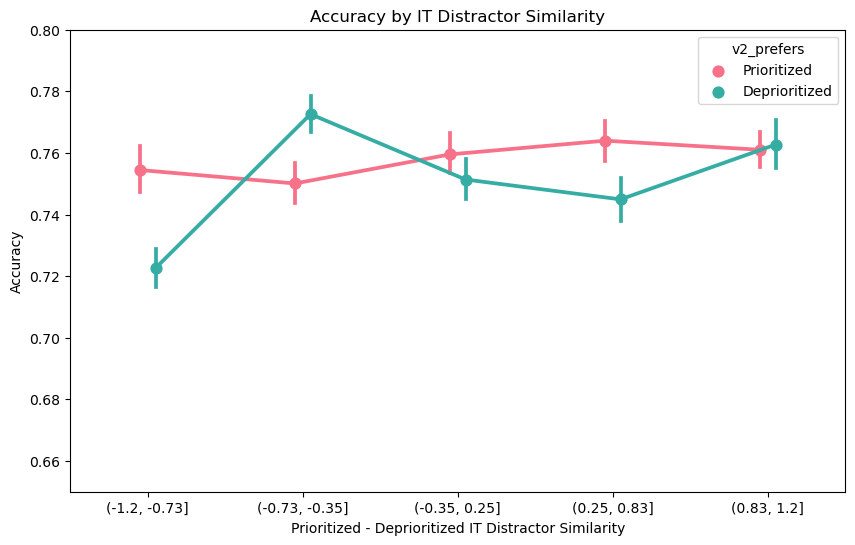

In [54]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='IT_diff_binned',
    y='Accuracy',
    hue = 'v2_prefers',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=palette[::-1],  # Use the single-color palette
    data=df
)
plt.ylim(0.65, 0.8)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity')
plt.title('Accuracy by IT Distractor Similarity')
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1380626430.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(46.88246527777777, 0.5, 'Accuracy')

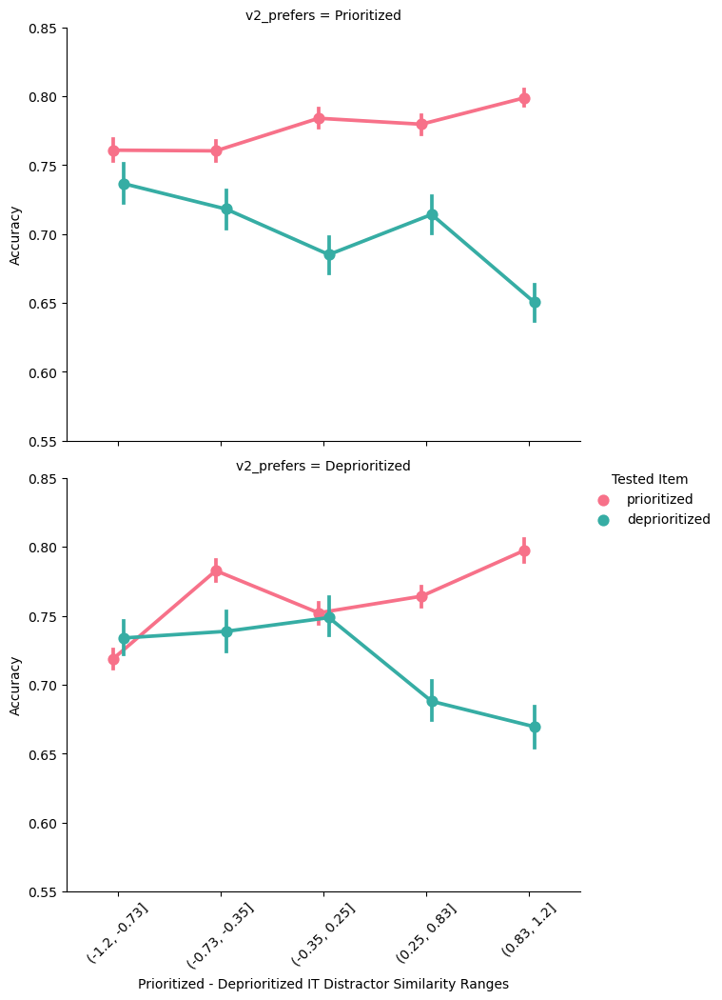

In [55]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            row = 'v2_prefers',
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

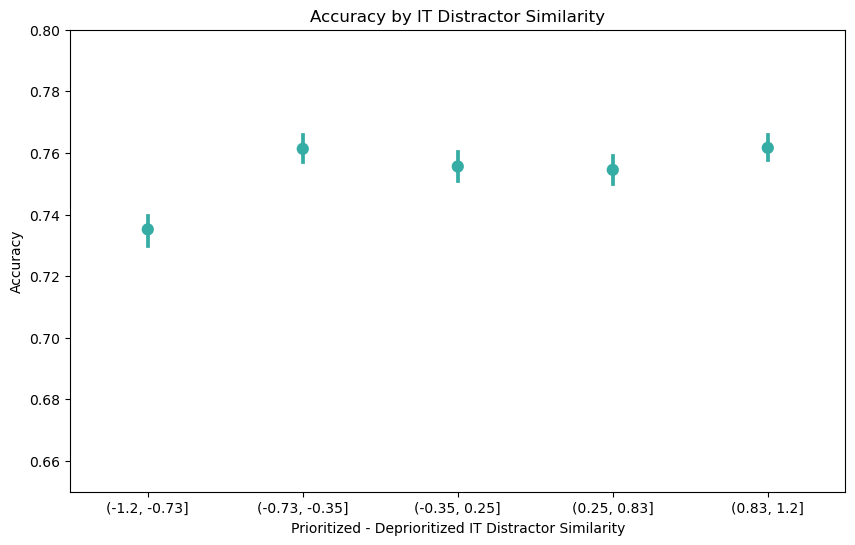

In [56]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='IT_diff_binned',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.65, 0.8)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity')
plt.title('Accuracy by IT Distractor Similarity')
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3329282332.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


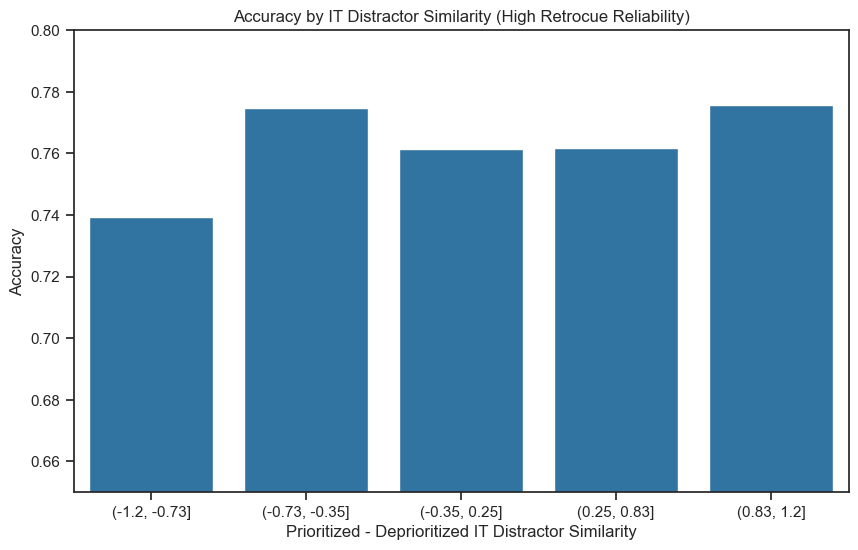

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3329282332.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


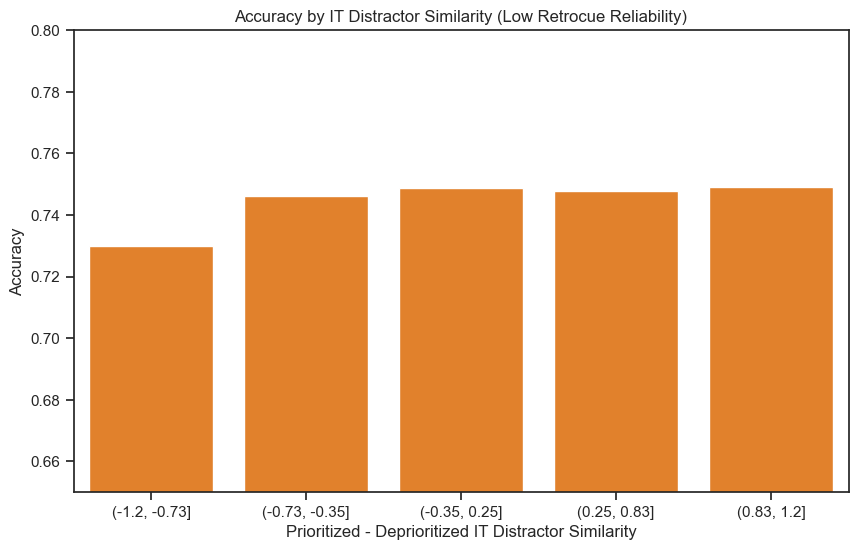

In [147]:

palette_retrocue = {"high": "#1f77b4", "low": "#ff7f0e"}

# Function to calculate subject-level means, then average across those means, and create the bar plot
def plot_retrocue_reliability_bar(data, title, color):
    # Step 1: Calculate subject-level means
    subject_means = data.groupby(['participant', 'IT_diff_binned'])['Accuracy'].mean().reset_index()

    # Step 2: Calculate the mean of the subject-level means for each IT_diff_binned category
    group_means = subject_means.groupby('IT_diff_binned')['Accuracy'].mean().reset_index()

    # Plotting the averaged data
    plt.figure(figsize=(10, 6))
    
    sns.barplot(
        x='IT_diff_binned',
        y='Accuracy',
        palette=[color],  # Apply specific color for reliability level
        data=group_means,
        ci=68  # Confidence interval set to 68%
    )
    
    # Customizing the plot appearance
    plt.ylim(0.65, 0.8)  # Set y-axis limits
    plt.ylabel('Accuracy')
    plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity')
    plt.title(title)
    plt.show()

# Example usage for high retrocue reliability
plot_retrocue_reliability_bar(df_high_retrocue, "Accuracy by IT Distractor Similarity (High Retrocue Reliability)", palette_retrocue["high"])

# Example usage for low retrocue reliability
plot_retrocue_reliability_bar(df_low_retrocue, "Accuracy by IT Distractor Similarity (Low Retrocue Reliability)", palette_retrocue["low"])


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2960163160.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


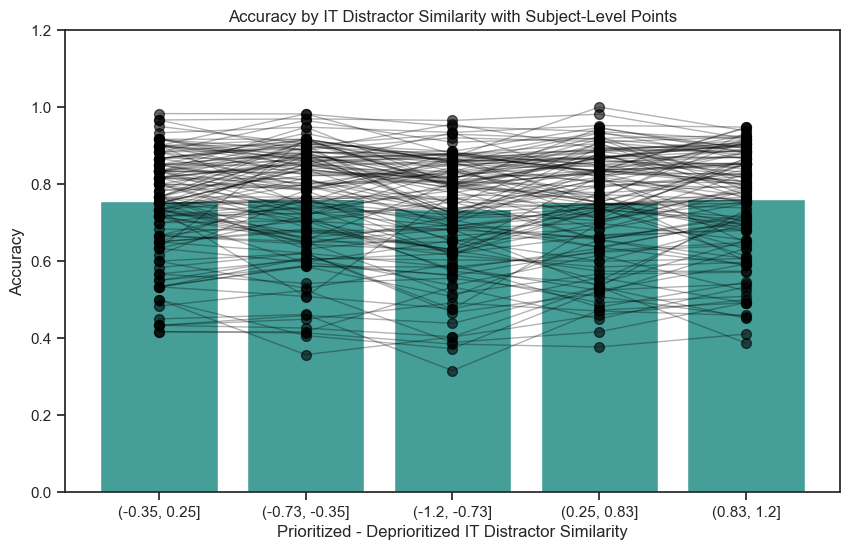

In [152]:
def plot_reliability_with_individual_points(data, title):
    # Step 1: Calculate subject-level means
    subject_means = data.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges'])['Accuracy'].mean().reset_index()

    # Step 2: Calculate the mean of the subject-level means for each IT_diff_binned category
    group_means = subject_means.groupby('Prioritized - Deprioritized IT Distractor Similarity Ranges')['Accuracy'].mean().reset_index()

    # Plotting the averaged data
    plt.figure(figsize=(10, 6))
    
    # Bar plot for group means
    sns.barplot(
        x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
        y='Accuracy',
        data=group_means,
        color=single_color,  # Use the specified color for the overall data
        ci=68  # Confidence interval set to 68%
    )
    
    # Plotting individual subject means as points and connecting them by lines
    for participant in subject_means['participant'].unique():
        # Get data for each participant
        participant_data = subject_means[subject_means['participant'] == participant]
        
        # Plot points for each participant
        plt.scatter(
            x=participant_data['Prioritized - Deprioritized IT Distractor Similarity Ranges'],
            y=participant_data['Accuracy'],
            color="black",
            s=50,
            alpha=0.6,
            zorder=10  # Ensures points are on top of bars
        )
        
        # Connect points for each participant
        plt.plot(
            participant_data['Prioritized - Deprioritized IT Distractor Similarity Ranges'],
            participant_data['Accuracy'],
            color="black",
            alpha=0.3,
            linewidth=1,
            zorder=9  # Ensures lines are behind points but above bars
        )

    # Customize plot appearance
    plt.ylim(0, 1.2)  # Set y-axis limits
    plt.ylabel('Accuracy')
    plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity')
    plt.title(title)
    plt.show()

# Example usage
plot_reliability_with_individual_points(df, "Accuracy by IT Distractor Similarity with Subject-Level Points")

In [158]:
# 'Prioritized - Deprioritized V2 Distractor Similarity Ranges'

0            (0.1, 0.17]
1        (-0.041, 0.042]
2           (0.042, 0.1]
3        (-0.11, -0.041]
4         (-0.17, -0.11]
              ...       
40195    (-0.041, 0.042]
40196       (0.042, 0.1]
40197     (-0.17, -0.11]
40198        (0.1, 0.17]
40199    (-0.11, -0.041]
Name: Prioritized - Deprioritized V2 Distractor Similarity Ranges, Length: 40200, dtype: category
Categories (5, interval[float64, right]): [(-0.17, -0.11] < (-0.11, -0.041] < (-0.041, 0.042] < (0.042, 0.1] < (0.1, 0.17]]

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/4065828055.py:34: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


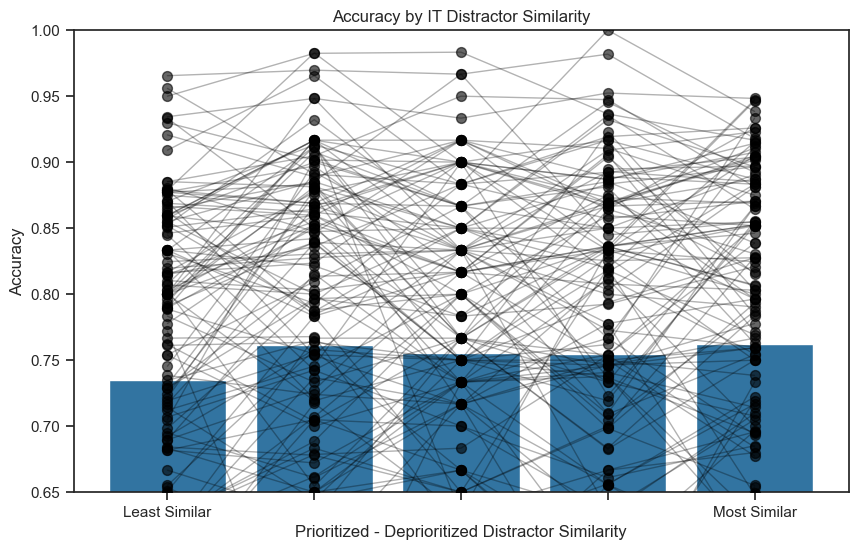

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/4065828055.py:34: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


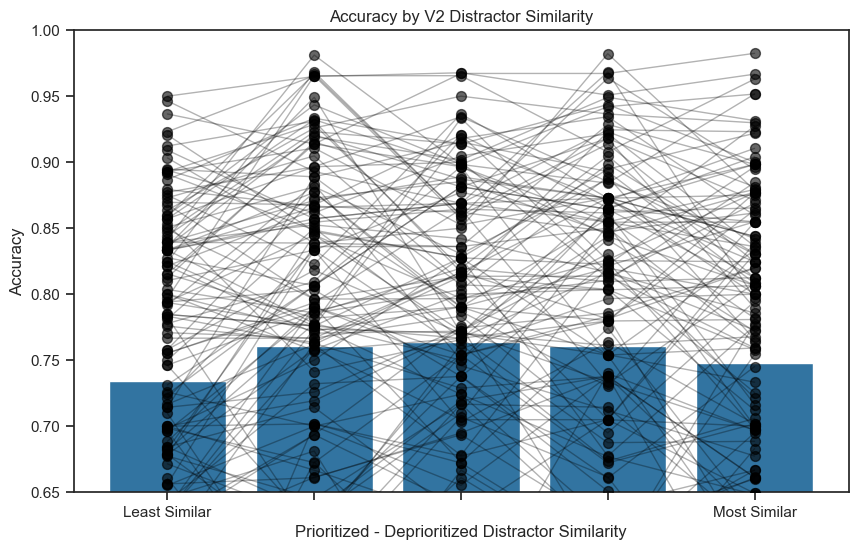

In [165]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a single color for the bar plot
single_color = "#1f77b4"

# Generalized function to calculate subject-level means and create the bar plot
def plot_similarity_accuracy(data, x_column, y_column, participant_column, title):
    """
    Plots a bar chart of the average `y_column` by `x_column`, with individual subject points and connecting lines.

    Parameters:
    - data (pd.DataFrame): The input dataframe containing the data.
    - x_column (str): The name of the column to use for the x-axis (e.g., 'Prioritized - Deprioritized IT Distractor Similarity Ranges' or 'Prioritized - Deprioritized V2 Distractor Similarity Ranges').
    - y_column (str): The name of the column to use for the y-axis (e.g., 'Accuracy').
    - participant_column (str): The name of the column identifying unique participants (e.g., 'participant').
    - title (str): The title for the plot.
    """
    # Check if required columns exist in the dataframe
    if x_column not in data.columns or y_column not in data.columns or participant_column not in data.columns:
        print(f"Error: One or more specified columns ({x_column}, {y_column}, {participant_column}) do not exist in the dataframe.")
        return

    # Step 1: Calculate subject-level means
    subject_means = data.groupby([participant_column, x_column])[y_column].mean().reset_index()

    # Step 2: Calculate the mean of the subject-level means for each x_column category
    group_means = subject_means.groupby(x_column)[y_column].mean().reset_index()

    # Plotting the averaged data
    plt.figure(figsize=(10, 6))
    
    # Bar plot for group means
    sns.barplot(
        x=x_column,
        y=y_column,
        data=group_means,
        color=single_color,  # Use the specified color for the overall data
        ci=68  # Confidence interval set to 68%
    )
    
    # Plotting individual subject means as points and connecting them by lines
    for participant in subject_means[participant_column].unique():
        # Get data for each participant
        participant_data = subject_means[subject_means[participant_column] == participant]
        
        # Plot points for each participant
        plt.scatter(
            x=participant_data[x_column],
            y=participant_data[y_column],
            color="black",
            s=50,
            alpha=0.6,
            zorder=10  # Ensures points are on top of bars
        )
        
        # Connect points for each participant
        plt.plot(
            participant_data[x_column],
            participant_data[y_column],
            color="black",
            alpha=0.3,
            linewidth=1,
            zorder=9  # Ensures lines are behind points but above bars
        )

    # Customize plot appearance
    plt.ylim(0.65, 1)  # Set y-axis limits
    plt.ylabel('Accuracy')
    plt.xlabel('Prioritized - Deprioritized Distractor Similarity')
    plt.title(title)
    plt.show()

# Example usage for IT
plot_similarity_accuracy(df, x_column='Prioritized - Deprioritized IT Distractor Similarity', y_column="Accuracy", participant_column="participant", title="Accuracy by IT Distractor Similarity")

# Example usage for V2
plot_similarity_accuracy(df, x_column='Prioritized - Deprioritized V2 Distractor Similarity', y_column="Accuracy", participant_column="participant", title="Accuracy by V2 Distractor Similarity")


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1448220088.py:40: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


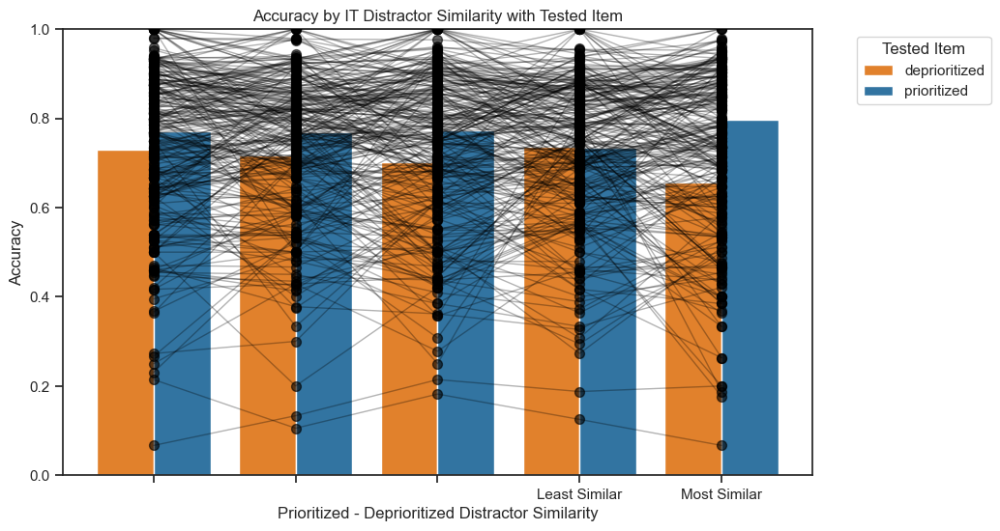

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1448220088.py:40: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  sns.barplot(


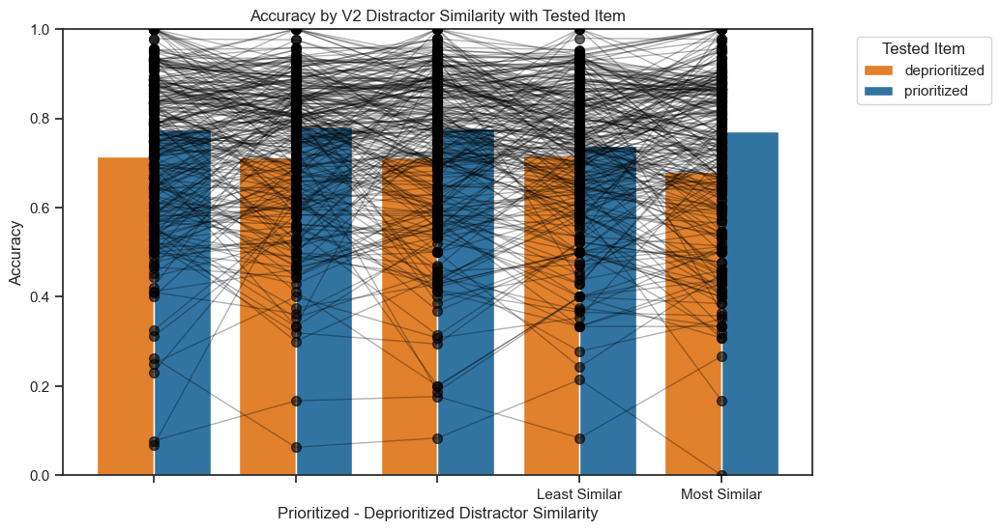

In [169]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define color palette for Tested Item categories
tested_item_palette = {"prioritized": "#1f77b4", "deprioritized": "#ff7f0e"}

# Generalized function to calculate subject-level means and create the bar plot with Tested Item as a hue
def plot_similarity_accuracy(data, x_column, y_column, participant_column, tested_item_column, title):
    """
    Plots a bar chart of the average `y_column` by `x_column`, with individual subject points and connecting lines.

    Parameters:
    - data (pd.DataFrame): The input dataframe containing the data.
    - x_column (str): The name of the column to use for the x-axis (e.g., 'Prioritized - Deprioritized IT Distractor Similarity Ranges' or 'Prioritized - Deprioritized V2 Distractor Similarity Ranges').
    - y_column (str): The name of the column to use for the y-axis (e.g., 'Accuracy').
    - participant_column (str): The name of the column identifying unique participants (e.g., 'participant').
    - tested_item_column (str): The name of the column indicating Tested Item ('Prioritized' or 'Deprioritized').
    - title (str): The title for the plot.
    """
    # Check if required columns exist in the dataframe
    required_columns = {x_column, y_column, participant_column, tested_item_column}
    if not required_columns.issubset(data.columns):
        missing_columns = required_columns - set(data.columns)
        print(f"Error: Missing columns in the dataframe: {missing_columns}")
        return

    # Convert intervals to strings if x_column contains intervals
    data[x_column] = data[x_column].astype(str)

    # Step 1: Calculate subject-level means
    subject_means = data.groupby([participant_column, x_column, tested_item_column])[y_column].mean().reset_index()

    # Step 2: Calculate the mean of the subject-level means for each x_column and Tested Item category
    group_means = subject_means.groupby([x_column, tested_item_column])[y_column].mean().reset_index()

    # Plotting the averaged data
    plt.figure(figsize=(10, 6))
    
    # Bar plot for group means, with Tested Item as hue
    sns.barplot(
        x=x_column,
        y=y_column,
        hue=tested_item_column,
        data=group_means,
        palette=tested_item_palette,  # Color based on Tested Item (Prioritized vs Deprioritized)
        ci=68  # Confidence interval set to 68%
    )
    
    # Plotting individual subject means as points and connecting them by lines within each Tested Item category
    for participant in subject_means[participant_column].unique():
        # Get data for each participant
        participant_data = subject_means[subject_means[participant_column] == participant]
        
        # Plot points for each Tested Item category for each participant
        for tested_item in participant_data[tested_item_column].unique():
            tested_item_data = participant_data[participant_data[tested_item_column] == tested_item]
            
            # Plot points
            plt.scatter(
                x=tested_item_data[x_column],
                y=tested_item_data[y_column],
                color="black",
                s=50,
                alpha=0.6,
                zorder=10
            )
            
            # Connect points for each participant within Tested Item categories
            plt.plot(
                tested_item_data[x_column],
                tested_item_data[y_column],
                color="black",
                alpha=0.3,
                linewidth=1,
                zorder=9
            )

    # Customize plot appearance
    plt.ylim(0, 1)  # Set y-axis limits
    plt.ylabel('Accuracy')
    plt.xlabel('Prioritized - Deprioritized Distractor Similarity')
    plt.title(title)
    plt.legend(title='Tested Item', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside plot
    plt.show()

# Example usage for IT with Tested Item
plot_similarity_accuracy(
    df,
    x_column='Prioritized - Deprioritized IT Distractor Similarity',
    y_column="Accuracy",
    participant_column="participant",
    tested_item_column="Tested Item",
    title="Accuracy by IT Distractor Similarity with Tested Item"
)

# Example usage for V2 with Tested Item
plot_similarity_accuracy(
    df,
    x_column='Prioritized - Deprioritized V2 Distractor Similarity',
    y_column="Accuracy",
    participant_column="participant",
    tested_item_column="Tested Item",
    title="Accuracy by V2 Distractor Similarity with Tested Item"
)


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2852279418.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

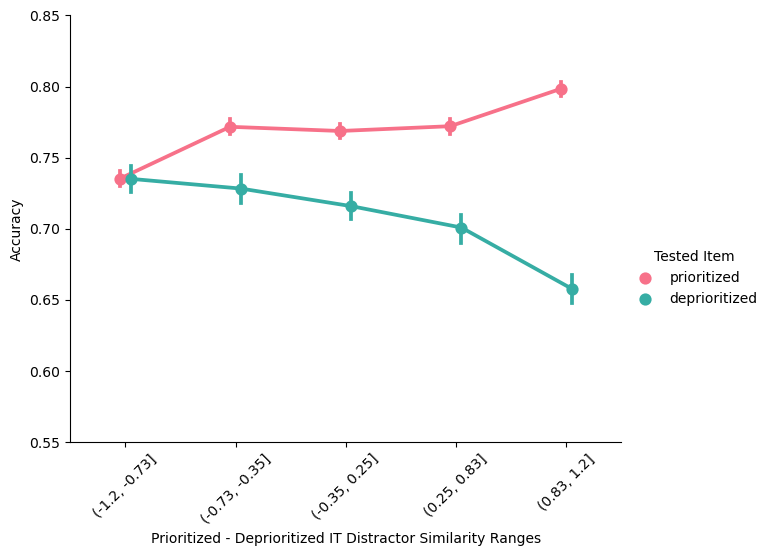

In [57]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
#             row = 'v2_prefers',
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/790103852.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.877985517568845, 0.5, 'Accuracy')

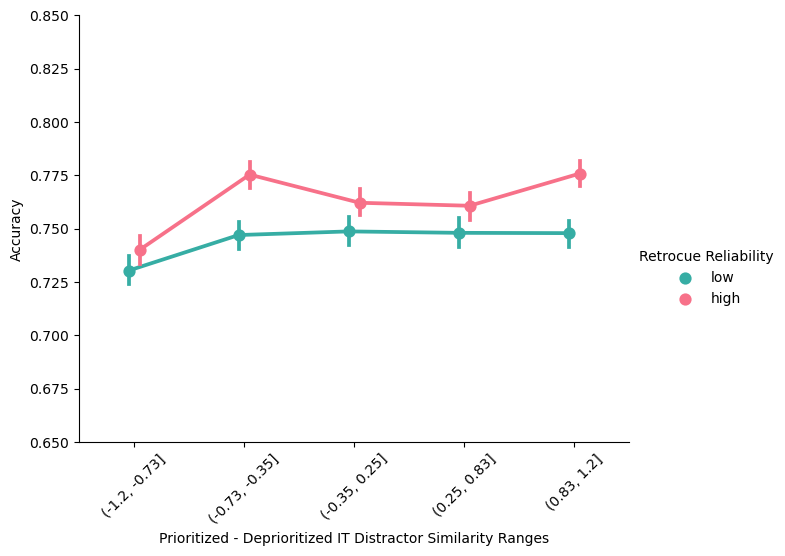

In [58]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.65, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/400314580.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


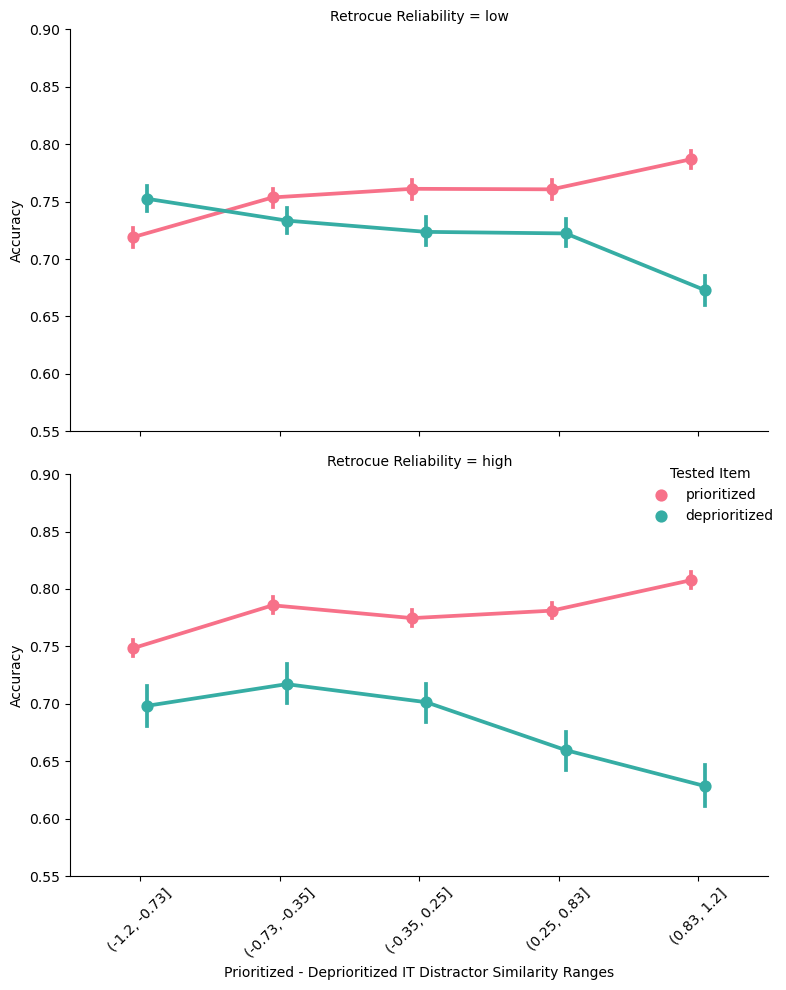

In [59]:


g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")
plt.tight_layout()
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/857288995.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


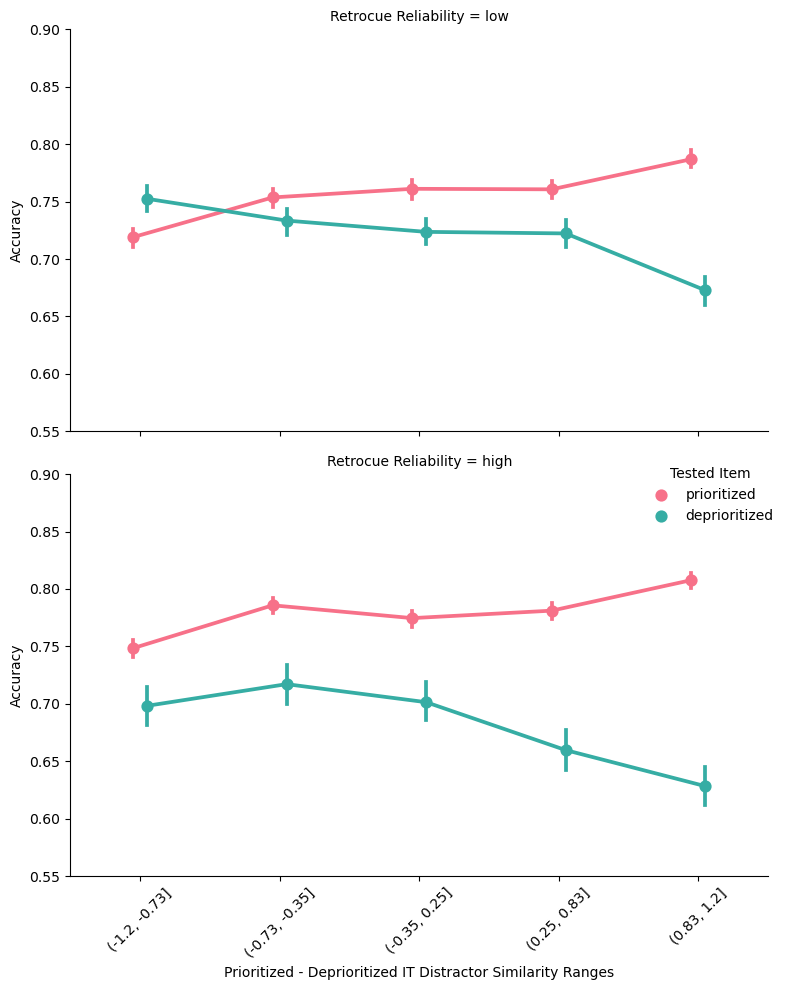

In [60]:

g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
#     row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")
plt.tight_layout()
plt.show()

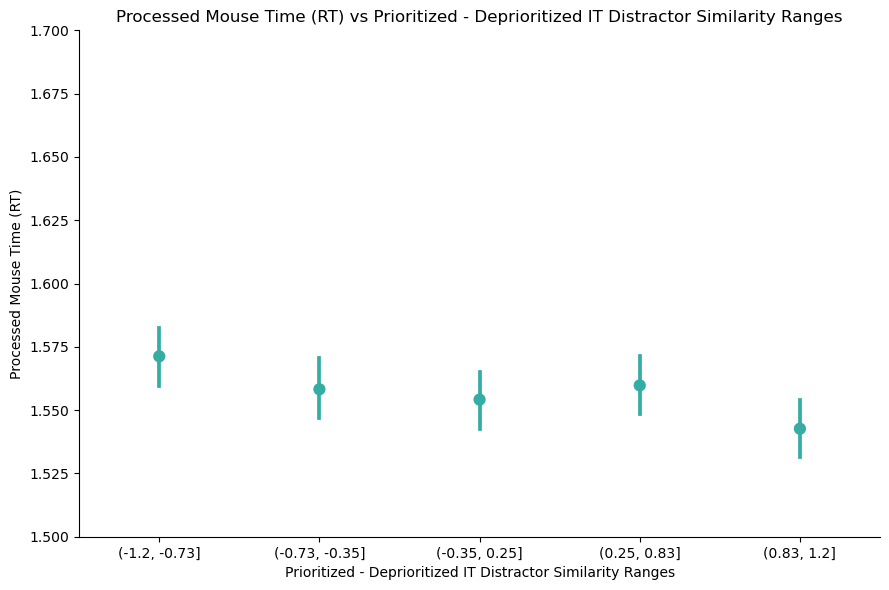

In [61]:
g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Ranges', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.7))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

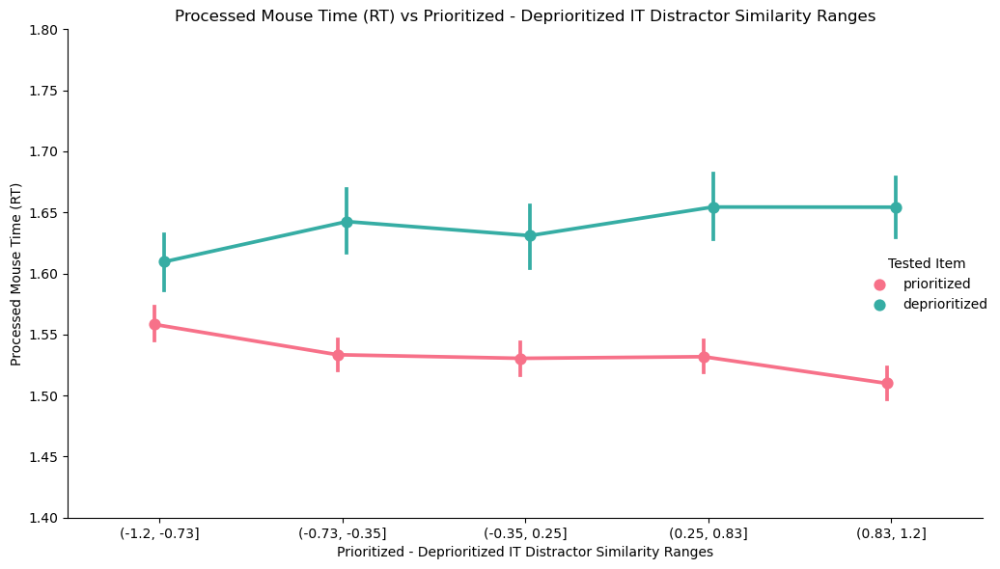

In [62]:
g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Ranges', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.8))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

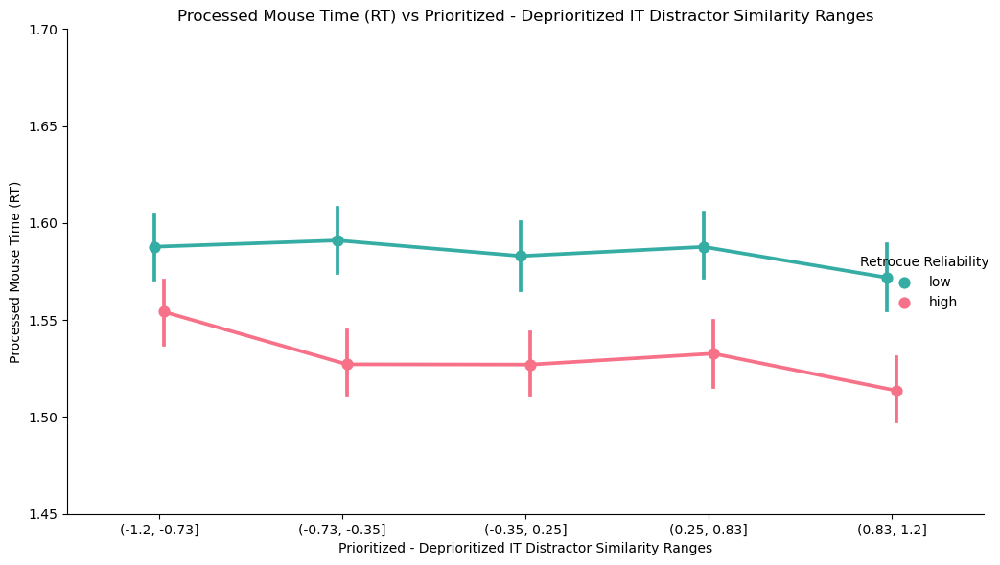

In [63]:
g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Ranges', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.45, 1.7))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.ylabel('Processed Mouse Time (RT)')
plt.title('Processed Mouse Time (RT) vs Prioritized - Deprioritized IT Distractor Similarity Ranges')
plt.tight_layout()
plt.show()

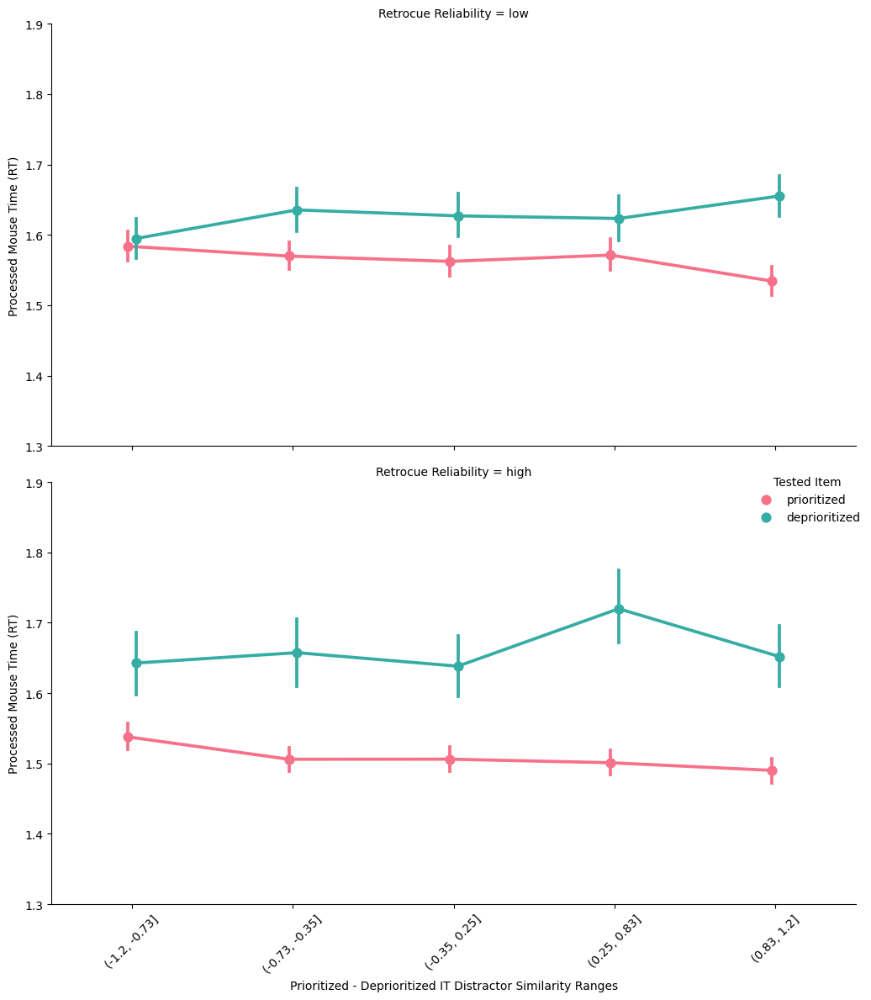

In [64]:
g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='analysis_rt',
    row='Retrocue Reliability',
    hue='Tested Item',  # Use 'row' instead of 'col'
    kind='point',
    row_order = ['low', 'high'],
    data=df_correct,
    dodge=True,
    height=6,
    aspect=1.5,
    palette=palette[::-1] # Use the reversed color order
)
g.set(ylim=(1.3, 1.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    ax.set_xlabel('Prioritized - Deprioritized IT Distractor Similarity Ranges')
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Set the y-axis label for all plots
g.set_axis_labels('Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Processed Mouse Time (RT)')

plt.tight_layout()
plt.show()

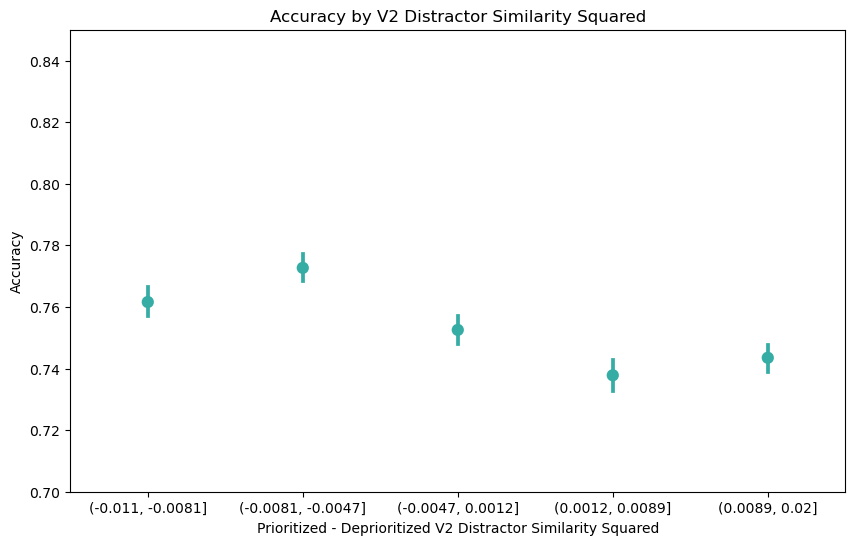

In [65]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='V2_diff_binned_sq',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.7, 0.85)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Squared')
plt.title('Accuracy by V2 Distractor Similarity Squared')
plt.show()




/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3699410078.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

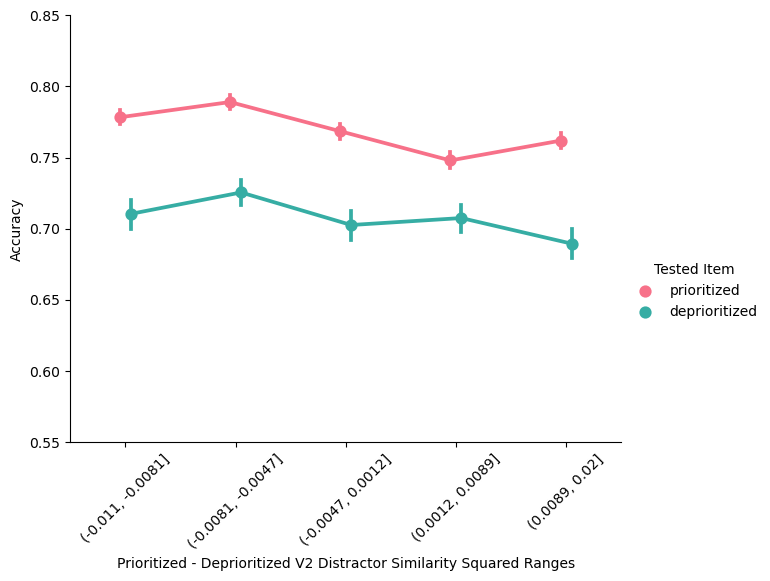

In [66]:

g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = sns.color_palette("husl", n_colors=2),  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')



/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3775300540.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.877985517568845, 0.5, 'Accuracy')

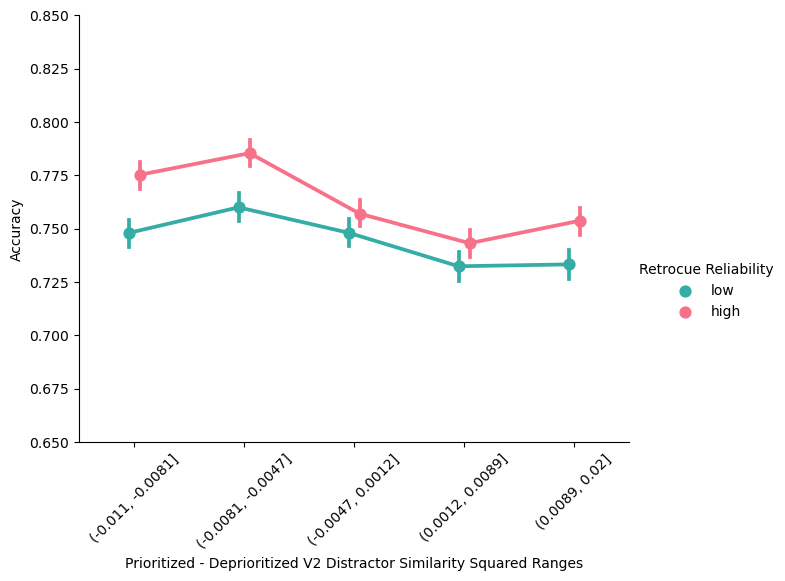

In [67]:

g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.65, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2709325249.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


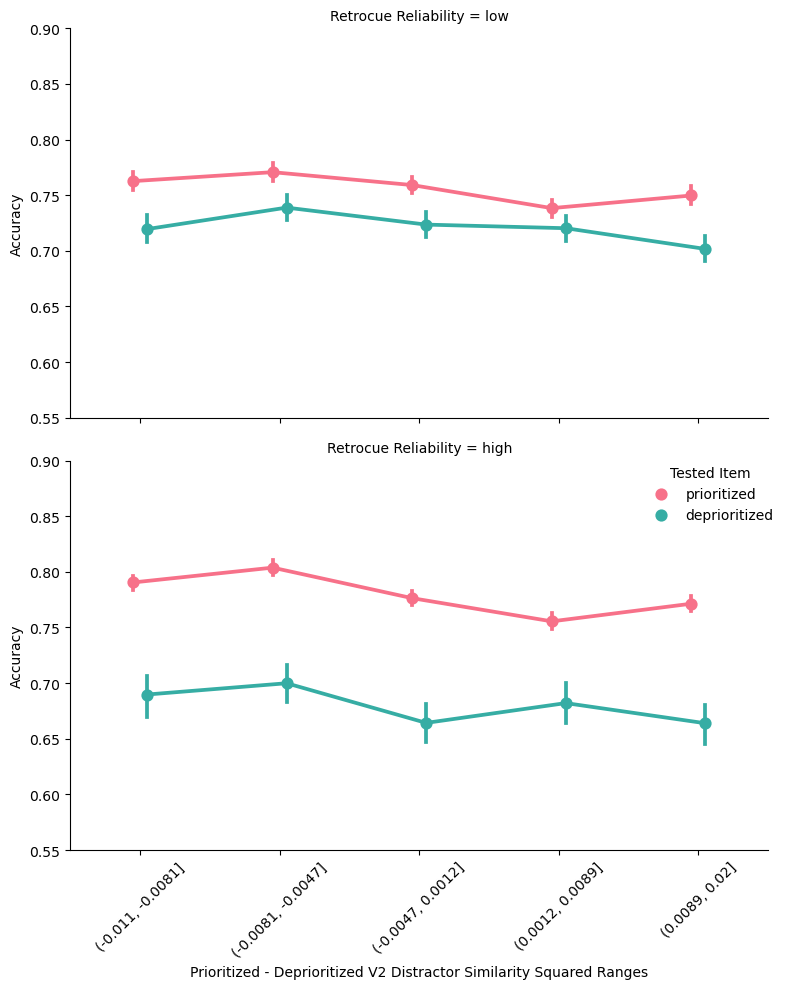

In [68]:


g = sns.catplot(
    x='Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges", "Accuracy")
plt.tight_layout()
plt.show()

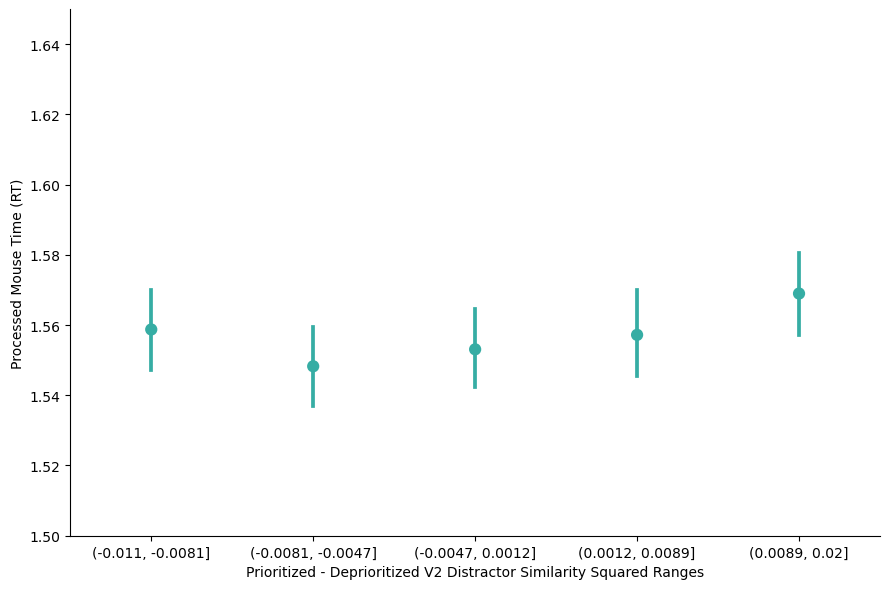

In [69]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.65))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nSquared Ranges')
plt.tight_layout()
plt.show()



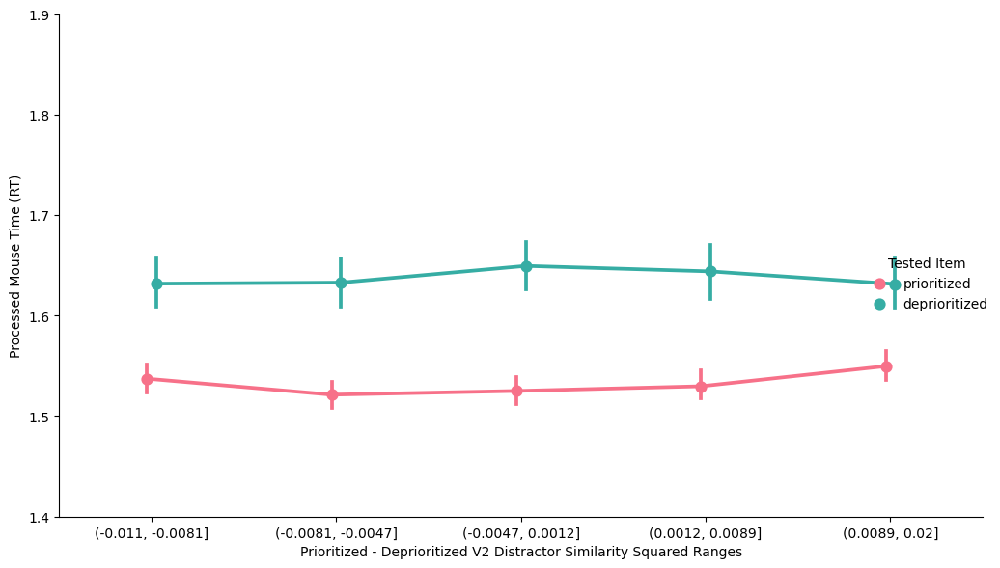

In [70]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.9))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()



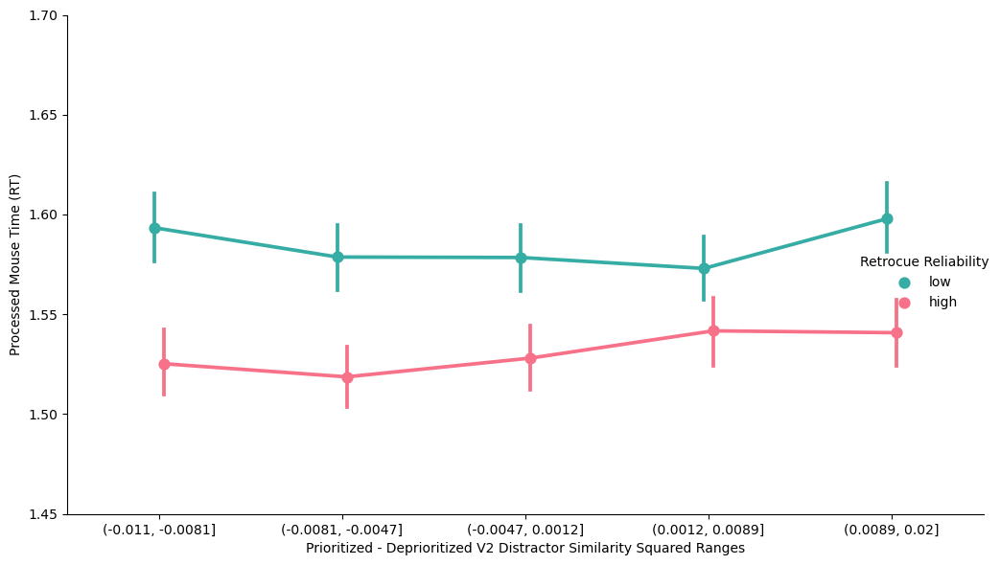

In [71]:
g = sns.catplot(x='Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.45, 1.7))

plt.xlabel('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
plt.tight_layout()
plt.show()



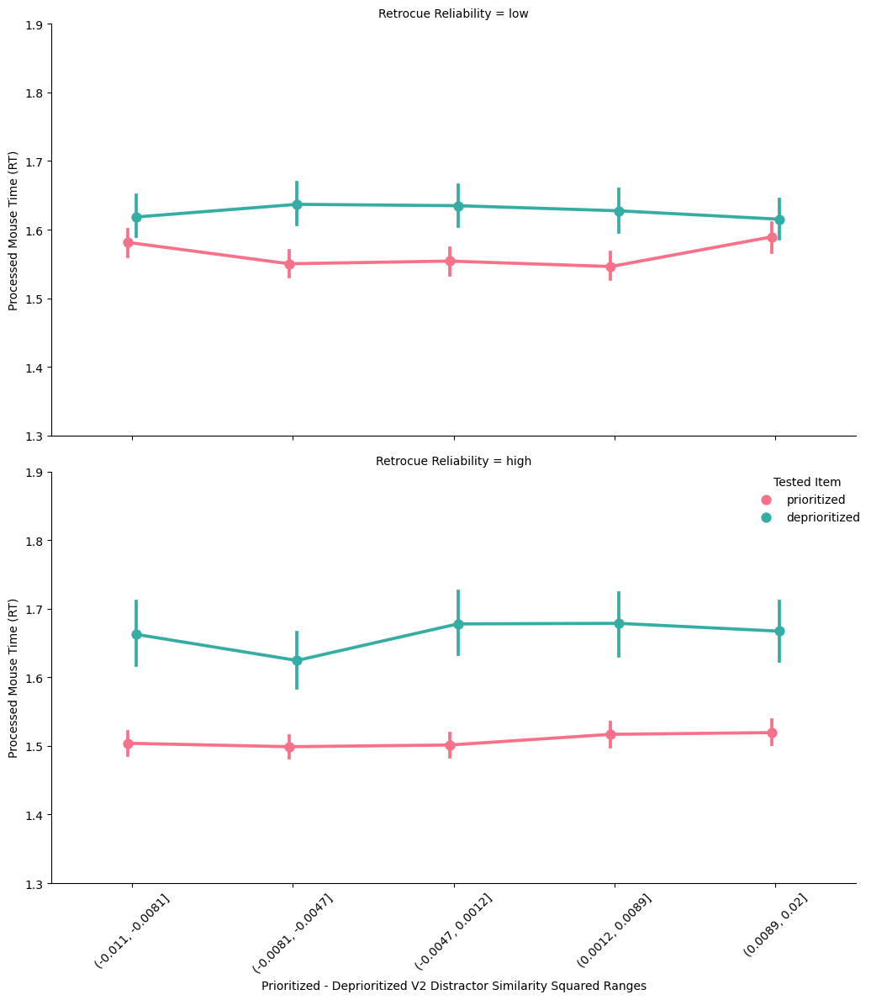

In [72]:
g = sns.catplot(
    x='Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges',
    y='analysis_rt',
    row='Retrocue Reliability',
    hue='Tested Item',  # Use 'row' instead of 'col'
    kind='point',
    row_order = ['low', 'high'], 
    data=df_correct,
    dodge=True,
    height=6,
    aspect=1.5,
    palette=palette[::-1]  # Use the reversed color order
)
g.set(ylim=(1.3, 1.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    ax.set_xlabel('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Set the y-axis label for all plots
g.set_axis_labels('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges', 'Processed Mouse Time (RT)')

plt.tight_layout()
plt.show()



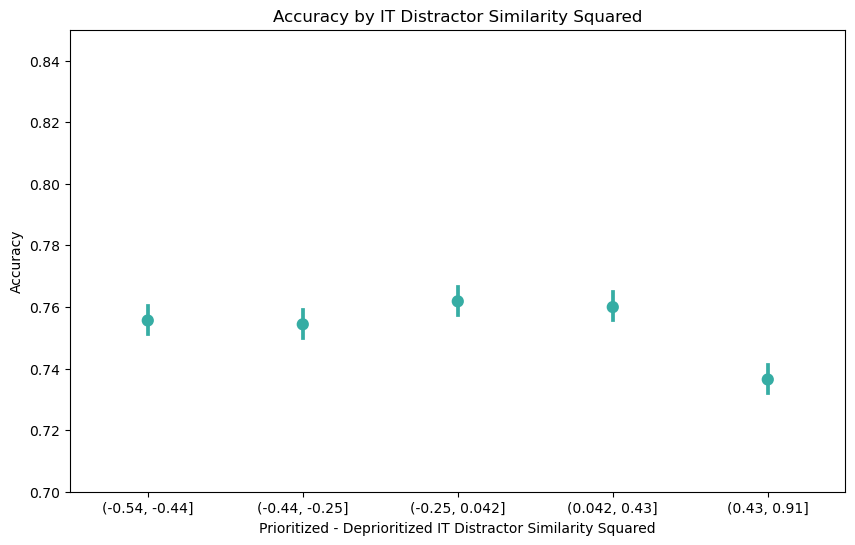

In [73]:
plt.figure(figsize=(10, 6))
sns.pointplot(
    x='IT_diff_binned_sq',
    y='Accuracy',
    errorbar=('ci', 68),  # Updated error bar parameter
    dodge=0.1,
    palette=single_color_palette,  # Use the single-color palette
    data=df
)
plt.ylim(0.7, 0.85)
plt.ylabel('Accuracy')
plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Squared')
plt.title('Accuracy by IT Distractor Similarity Squared')
plt.show()


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3125865.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

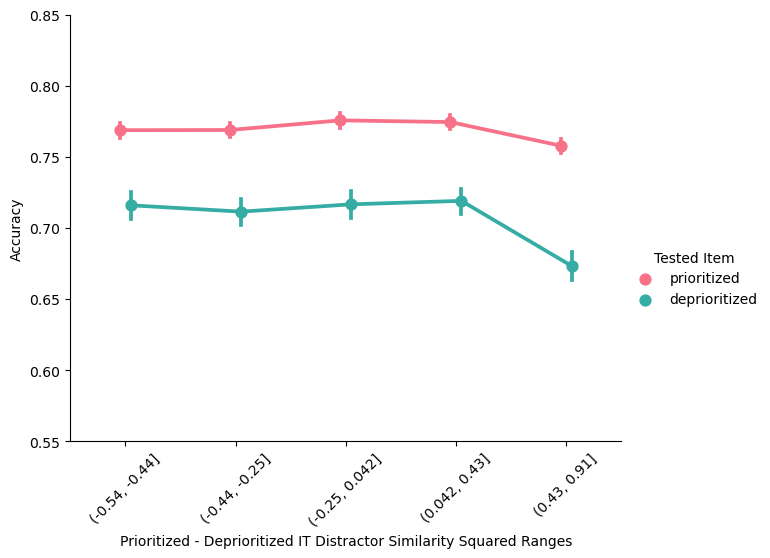

In [74]:


g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Squared Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = sns.color_palette("husl", n_colors=2),  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')



/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/103419771.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.877985517568845, 0.5, 'Accuracy')

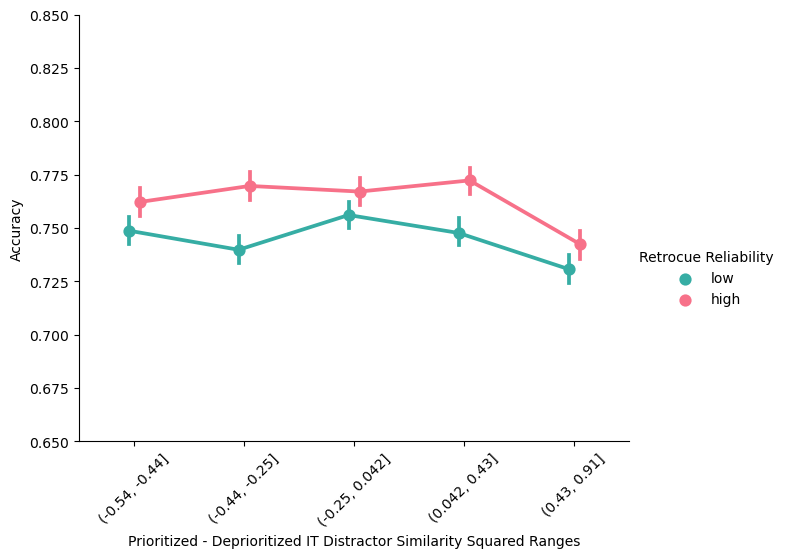

In [75]:

g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Squared Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'Retrocue Reliability',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette,  # Reverse the color order
            data = df)
g.set(ylim=(0.65, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')



/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/603937276.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


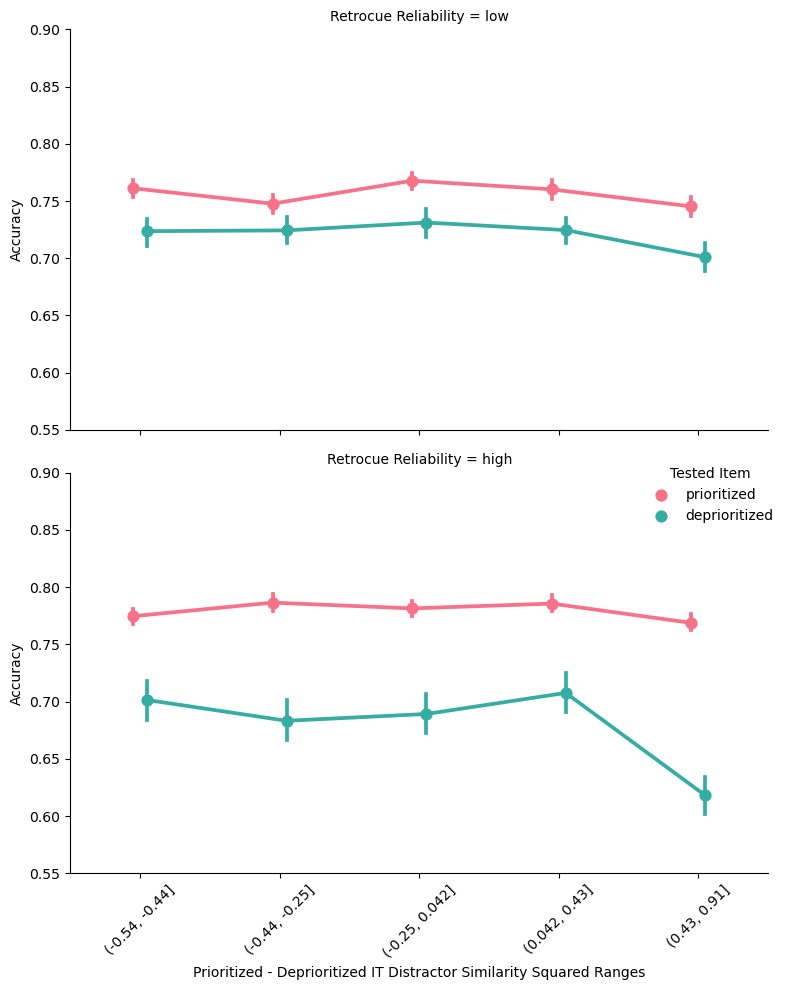

In [76]:

g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Squared Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Squared Ranges", "Accuracy")
plt.tight_layout()
plt.show()

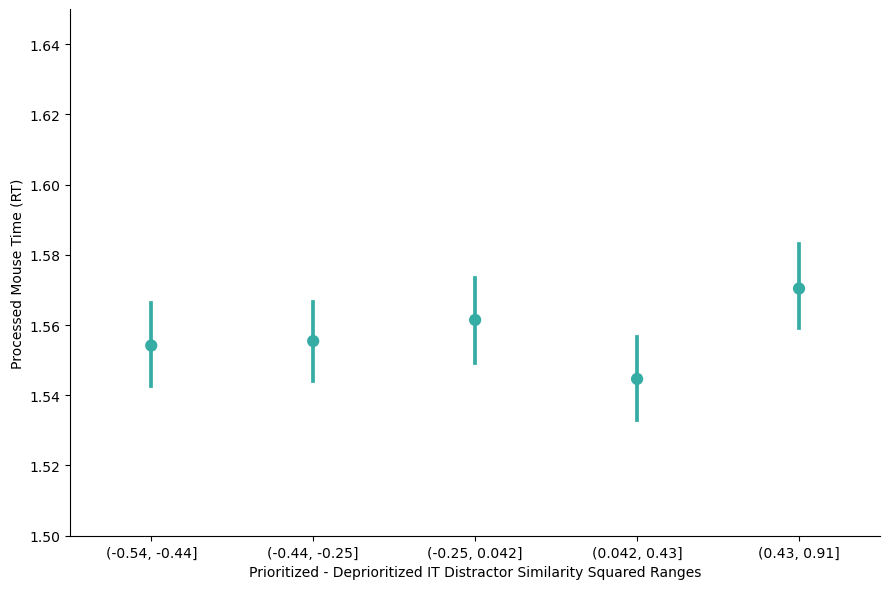

In [77]:
g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Squared Ranges', y='analysis_rt', 
#                 hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            # order=['Least Similar', ' ', ' ', ' ', 'Most Similar'],  # Specify the order of the categories
            palette = single_color_palette  # Reverse the color order
)
g.set(ylim=(1.5, 1.65))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nSquared Ranges')
plt.tight_layout()
plt.show()


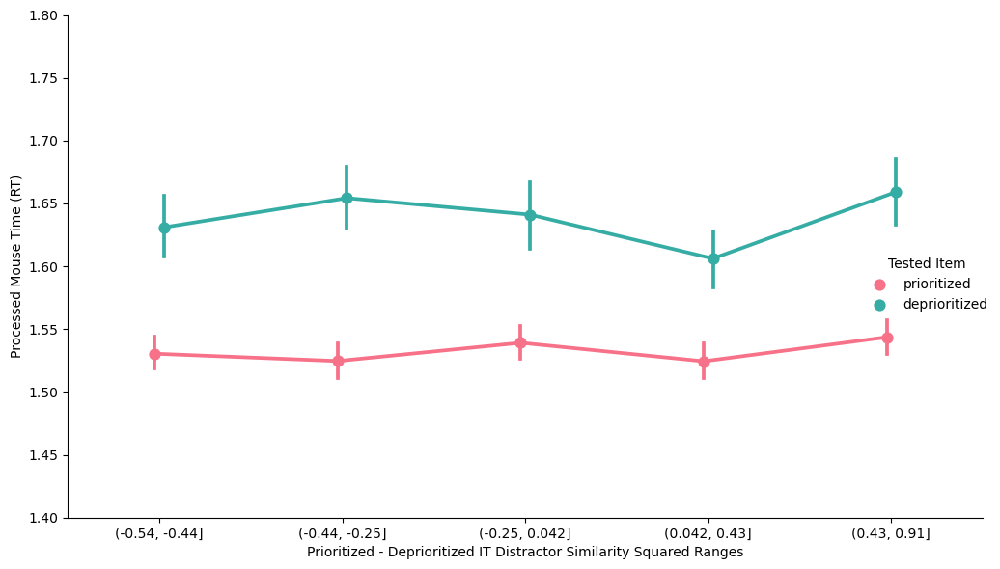

In [78]:

g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Squared Ranges', y='analysis_rt', 
                hue='Tested Item', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette[::-1]  # Reverse the color order
)
g.set(ylim=(1.4, 1.8))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Processed Mouse Time (RT) vs V2 Distractor Similarity\nto Prioritized Item')
plt.tight_layout()
plt.show()



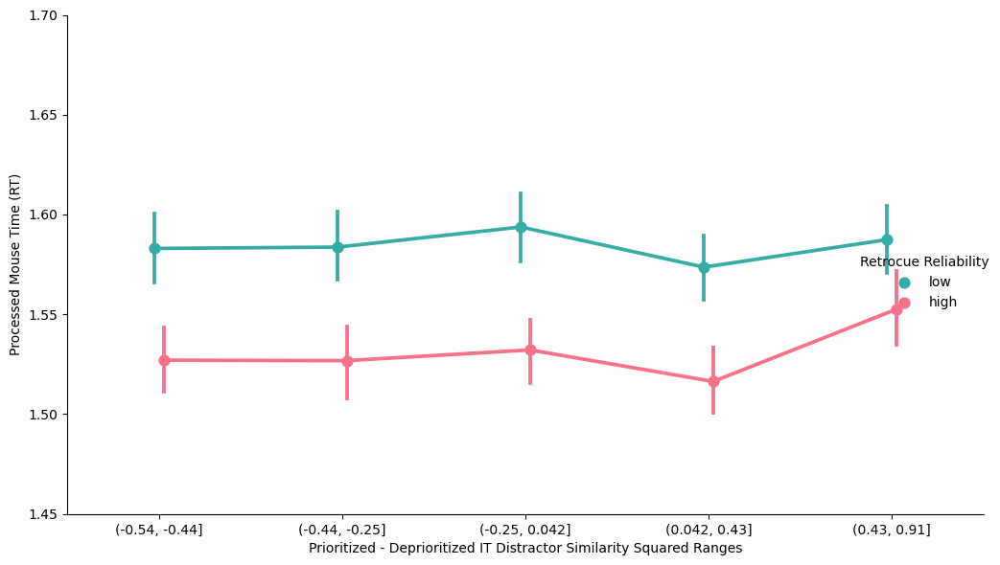

In [79]:

g = sns.catplot(x='Prioritized - Deprioritized IT Distractor Similarity Squared Ranges', y='analysis_rt', 
                hue='Retrocue Reliability', 
            kind='point', data=df_correct, dodge=True, height=6, aspect=1.5, 
            palette = palette  # Reverse the color order
)
g.set(ylim=(1.45, 1.7))

plt.xlabel('Prioritized - Deprioritized IT Distractor Similarity Squared Ranges')
plt.ylabel('Processed Mouse Time (RT)')
# plt.title('Prioritized - Deprioritized V2 Distractor Similarity Squared Ranges')
plt.tight_layout()
plt.show()



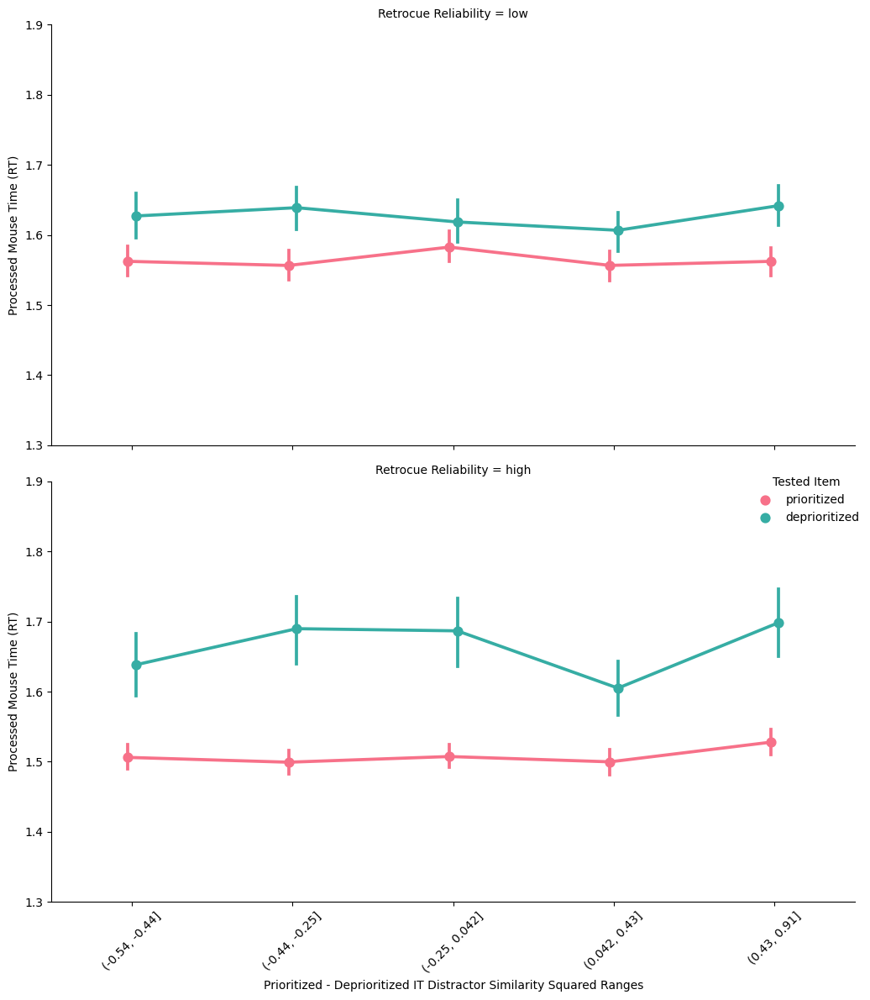

In [80]:
g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Squared Ranges',
    y='analysis_rt',
    row='Retrocue Reliability',
    hue='Tested Item',  # Use 'row' instead of 'col'
    kind='point',
    row_order = ['low', 'high'],
    data=df_correct,
    dodge=True,
    height=6,
    aspect=1.5,
    palette=palette[::-1]  # Use the reversed color order
)
g.set(ylim=(1.3, 1.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    ax.set_xlabel('Prioritized - Deprioritized IT Distractor Similarity Squared Ranges')
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Set the y-axis label for all plots
g.set_axis_labels('Prioritized - Deprioritized IT Distractor Similarity Squared Ranges', 'Processed Mouse Time (RT)')

plt.tight_layout()
plt.show()


In [81]:
len(set(df['participant']))

134

In [82]:
# df.to_csv('old_dataframe.csv', index=False)  # Set index=False to avoid saving row indices
# # 

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3730263845.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.21367521367522, 0.5, 'Accuracy')

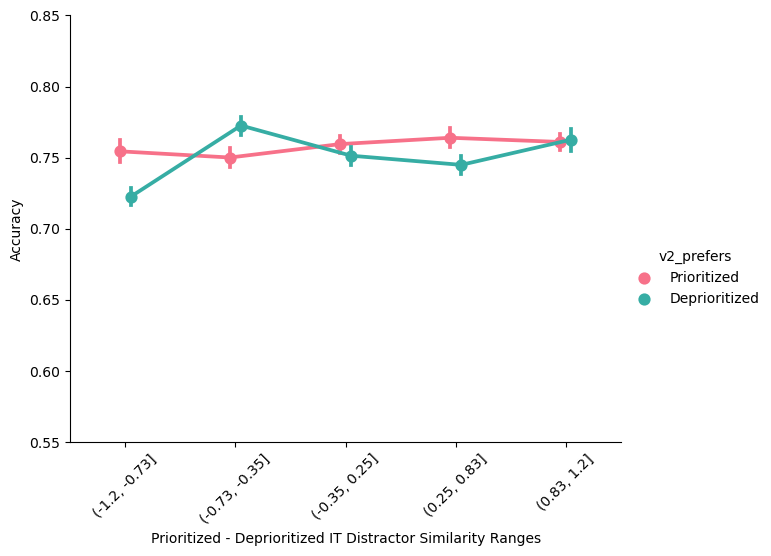

In [83]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'v2_prefers',
#             hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1380626430.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(46.88246527777777, 0.5, 'Accuracy')

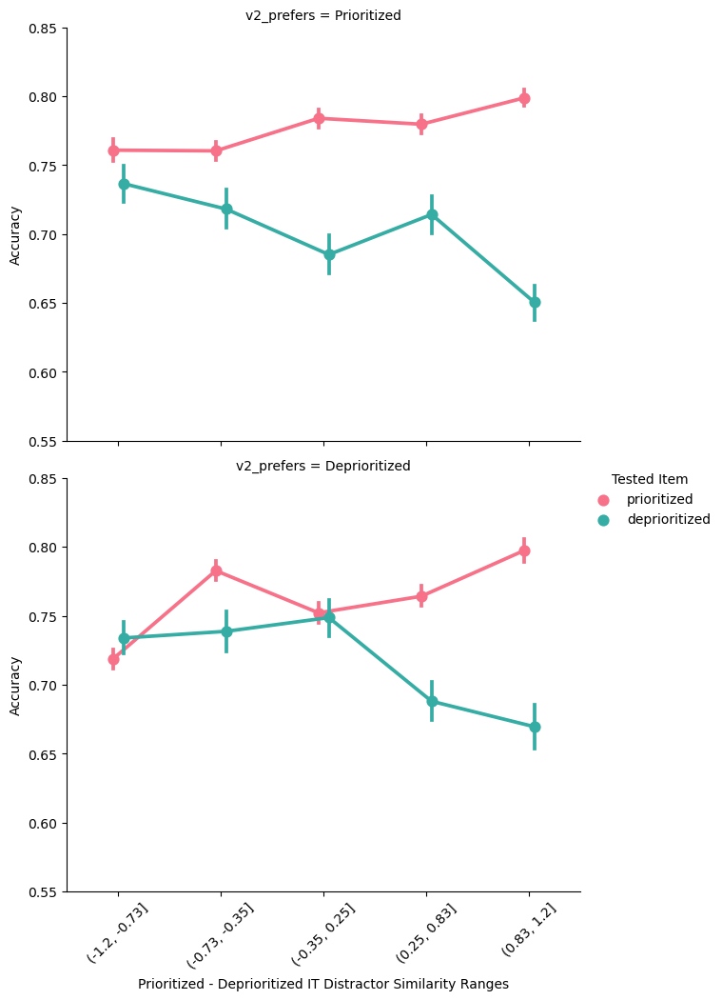

In [84]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized IT Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            row = 'v2_prefers',
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1772617952.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(45.21367521367522, 0.5, 'Accuracy')

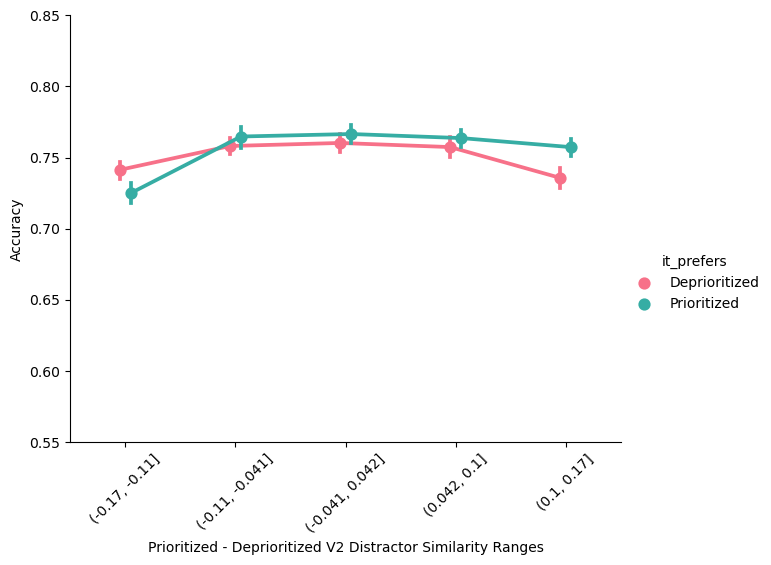

In [85]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            hue = 'it_prefers',
#             hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2612231446.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


Text(44.99652777777777, 0.5, 'Accuracy')

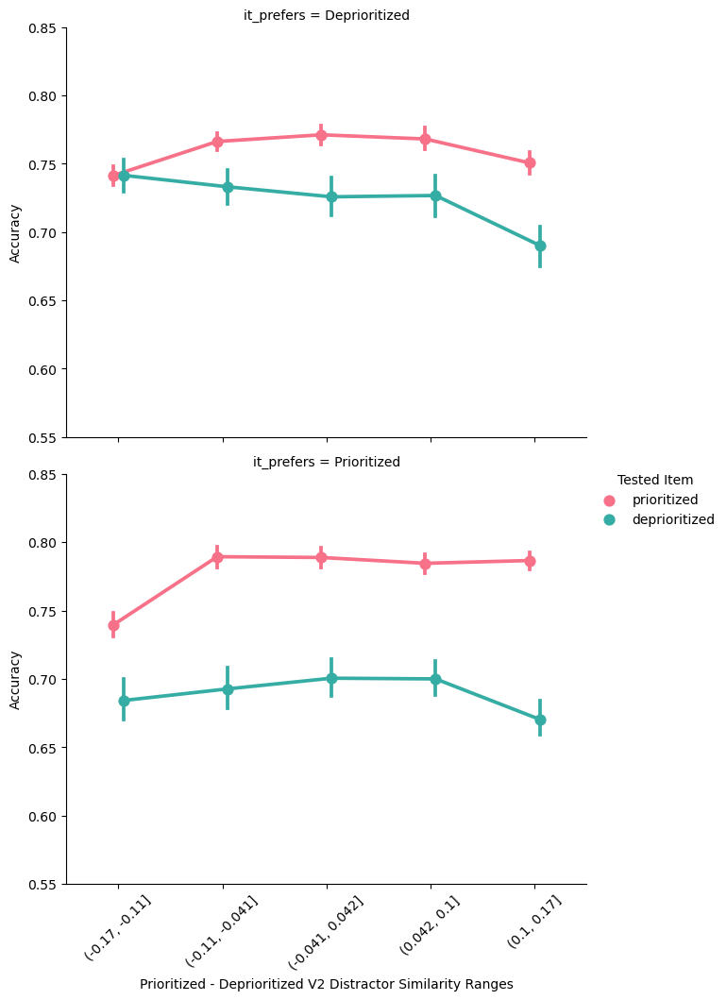

In [86]:
g = sns.catplot(
            x = 'Prioritized - Deprioritized V2 Distractor Similarity Ranges',
            y = 'Accuracy',
            ci = 68,
            row = 'it_prefers',
            hue = 'Tested Item',
            # col = 'Retrocue Reliability',
            aspect = 1.3,
            dodge = 0.1,
            kind = 'point',
            
            palette = palette[::-1],  # Reverse the color order
            data = df)
g.set(ylim=(0.55, 0.85))
plt.xticks(rotation=45)

plt.ylabel('Accuracy')

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/2051032623.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


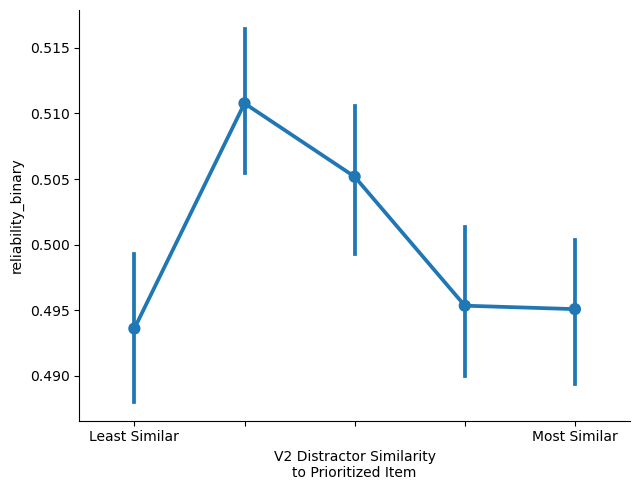

In [87]:

g = sns.catplot(
    x='V2 Distractor Similarity\nto Prioritized Item',
    y='reliability_binary',
    ci=68,
#     hue='Tested Item',
#     row='Retrocue Reliability',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    dodge=0.5,
    kind='point',
    row_order = ['low', 'high'],
#     palette=palette,  # Reverse the color order
    data=df)


plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/802395013.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


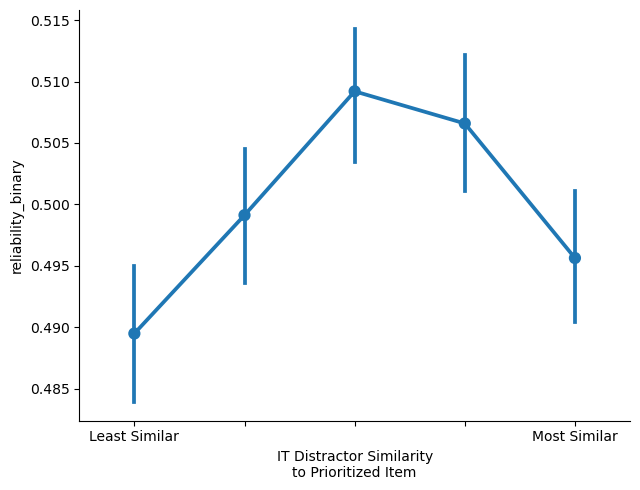

In [88]:

g = sns.catplot(
    x='IT Distractor Similarity\nto Prioritized Item',
    y='reliability_binary',
    ci=68,
#     hue='Tested Item',
#     row='Retrocue Reliability',  # Use 'row' instead of 'col' to arrange plots vertically
    aspect=1.3,
    dodge=0.5,
    kind='point',
    row_order = ['low', 'high'],
#     palette=palette,  # Reverse the color order
    data=df)


plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/4269821370.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


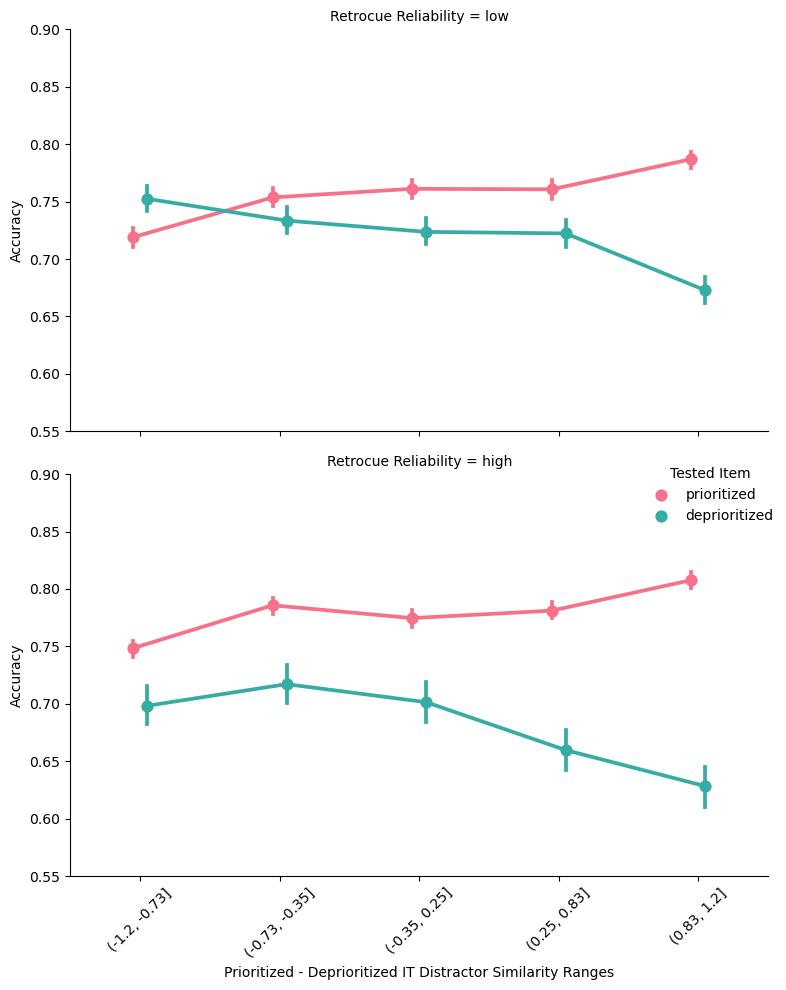

In [89]:
g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order = ['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette[::-1],  # Use the reversed color order
    data=df
)
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")
plt.tight_layout()
plt.show()

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3533399917.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


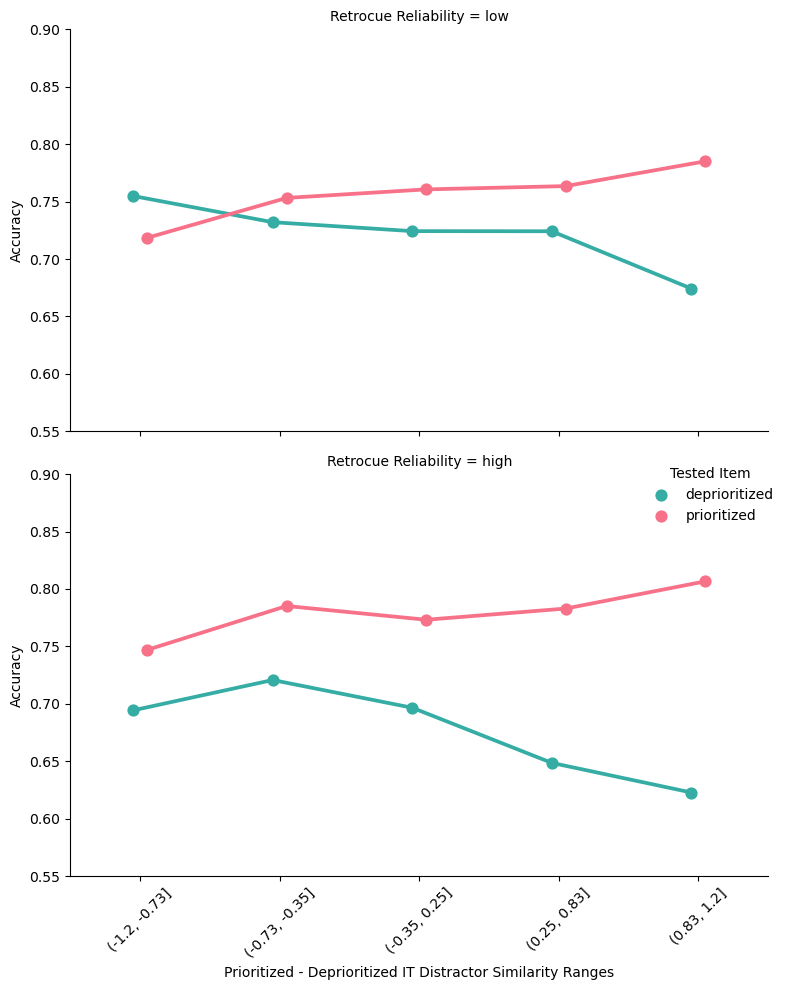

In [90]:
subject_means = df.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# Calculate the mean across subjects for each group
group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# Plotting
g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    ci=68,
    hue='Tested Item',
    row='Retrocue Reliability',  # Use 'row' instead of 'col'
    aspect=1.3,
    row_order=['low', 'high'],
    dodge=0.1,
    kind='point',
    palette=palette,  # Use the reversed color order
    data=group_means
)

# Set limits and labels
g.set(ylim=(0.55, 0.9))
g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")

# Rotate x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

plt.tight_layout()
plt.show()

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker  # Import ticker here
import pandas as pd

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1722188309.py:15: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(


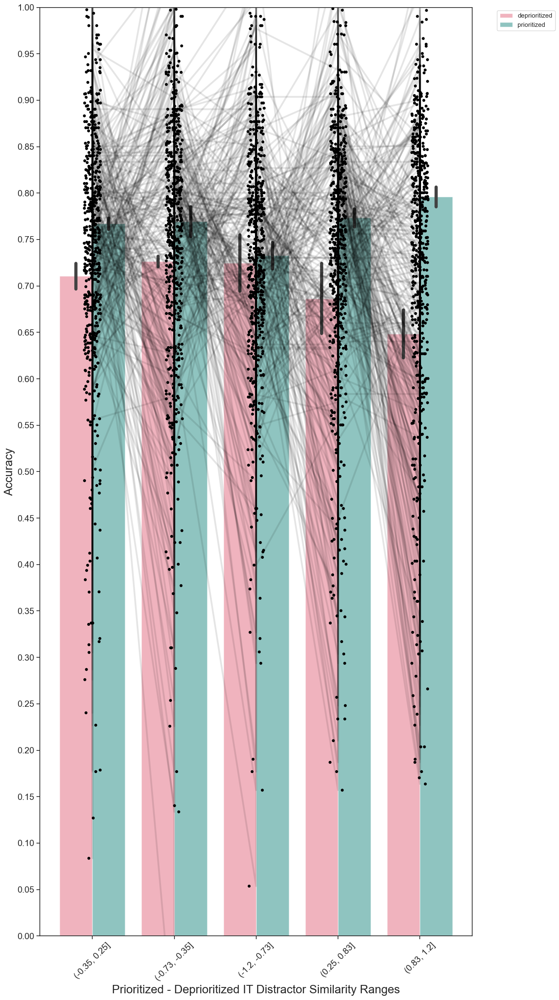

In [115]:
palette_retrocue = {"high": "#1f77b4", "low": "#ff7f0e"}  # Customize as needed

df['Prioritized - Deprioritized IT Distractor Similarity Ranges'] = df['Prioritized - Deprioritized IT Distractor Similarity Ranges'].astype(str)

subject_means = df.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()
group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()


fig, ax = plt.subplots(figsize=(16, 24))  # Increase figure size for better visibility
sns.set(style="ticks", rc={"lines.linewidth": 3})

# Create a stripplot for individual subject-level means with jitter for separation
sns.stripplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    data=subject_means,
    hue='Tested Item',
    palette=['black'],
    marker="o",
    jitter=True,
    s=5,
    zorder=10,
    ax=ax
)

# Overlay the bar plot for the mean accuracy across subjects in each group
sns.barplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    hue='Tested Item',
    palette=palette[::-1],
    data=group_means,
    ax=ax,
    alpha=0.6
)

# Connect individual points to show change across categories for each subject
unique_subjects = subject_means['participant'].unique()
for subject in unique_subjects:
    subset = subject_means[subject_means['participant'] == subject]
    for reliability in subset['Retrocue Reliability'].unique():
        sub_subset = subset[subset['Retrocue Reliability'] == reliability]
        if sub_subset.shape[0] > 1:
            ax.plot(
                sub_subset['Prioritized - Deprioritized IT Distractor Similarity Ranges'],
                sub_subset['Accuracy'],
                color="black",
                alpha=0.1
            )

# Customize axis and plot appearance
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates by creating a dictionary
ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

# Customize axis and plot appearance
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.05))
ax.set_ylim(0, 1)
ax.set_xlabel("Prioritized - Deprioritized IT Distractor Similarity Ranges", fontsize=20)
ax.set_ylabel("Accuracy", fontsize=20)
ax.tick_params(axis='x', rotation=45, labelsize=15)
ax.tick_params(axis='y', labelsize=15)

fig.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust rect to create space for the legend
plt.show()




/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3223830374.py:20: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(


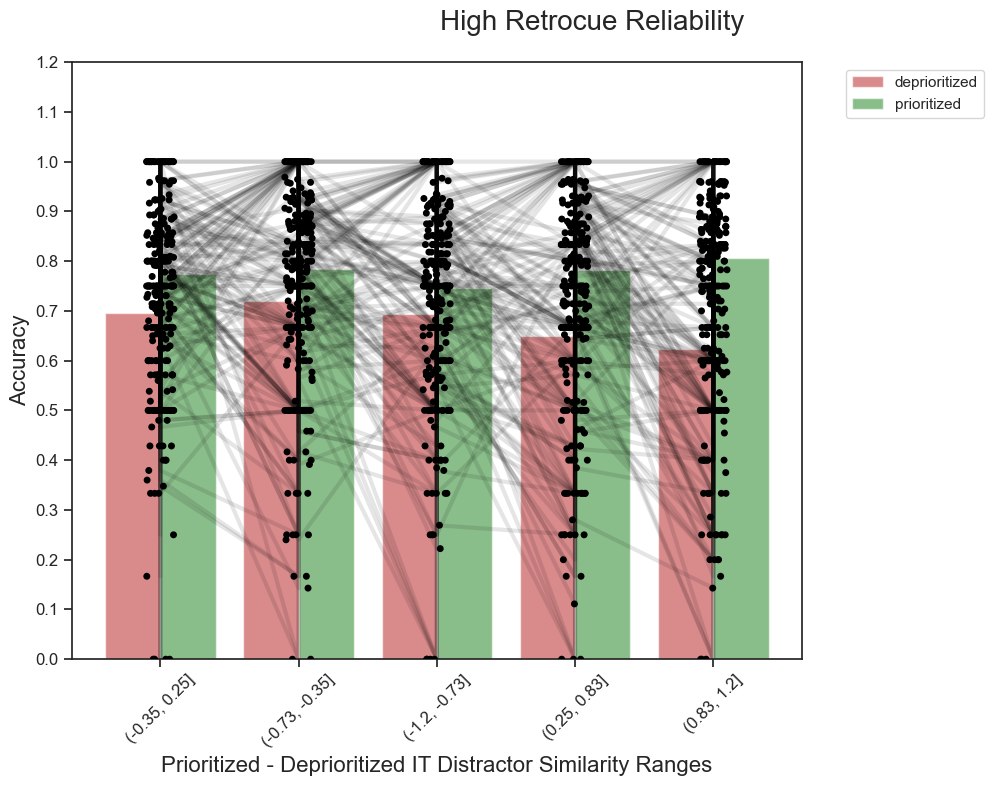

/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/3223830374.py:20: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(


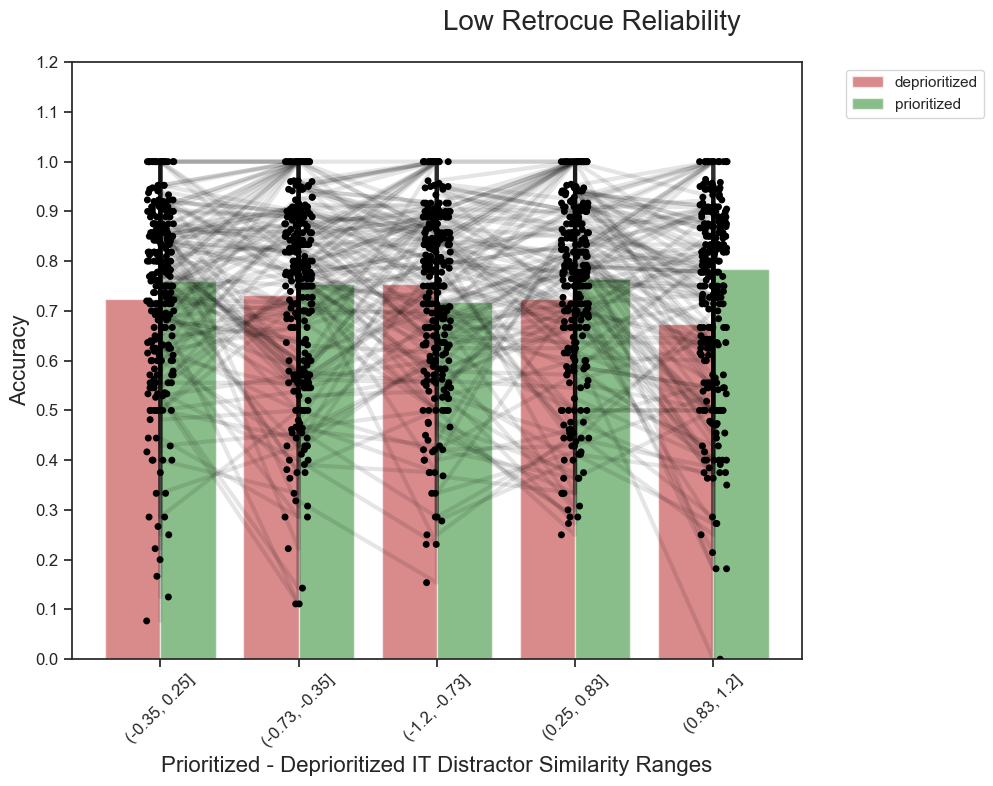

In [141]:


# Define color palette for Retrocue Reliability and Tested Item (Prioritized vs. Deprioritized)
palette_retrocue = {"high": "#1f77b4", "low": "#ff7f0e"}
palette_tested_item = {"prioritized": "#2ca02c", "deprioritized": "#d62728"}  # Colors for each Tested Item

# Split the data into two subsets based on Retrocue Reliability
df_high_retrocue = df[df['Retrocue Reliability'] == 'high']
df_low_retrocue = df[df['Retrocue Reliability'] == 'low']

# Function to create plot for each subset
def plot_retrocue_reliability(data, title, color_map):
    # Calculate subject-level and group means
    subject_means = data.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item'])['Accuracy'].mean().reset_index()
    group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item'])['Accuracy'].mean().reset_index()

    # Plotting
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.set(style="ticks", rc={"lines.linewidth": 3})

    # Individual subject-level means with jitter
    sns.stripplot(
        x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
        y='Accuracy',
        data=subject_means,
        hue='Tested Item',
        palette=['black'],
        marker="o",
        jitter=True,
        s=5,
        zorder=10,
        ax=ax
    )

    # Mean accuracy across subjects in each group
    sns.barplot(
        x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
        y='Accuracy',
        hue='Tested Item',
        palette=color_map,  # Color based on Tested Item (Prioritized vs. Deprioritized)
        data=group_means,
        ax=ax,
        alpha=0.6
    )

    # Connection lines for individual subjects
    unique_subjects = subject_means['participant'].unique()
    for subject in unique_subjects:
        subset = subject_means[subject_means['participant'] == subject]
        if subset.shape[0] > 1:
            ax.plot(
                subset['Prioritized - Deprioritized IT Distractor Similarity Ranges'],
                subset['Accuracy'],
                color="black",
                alpha=0.1
            )

    # Customize appearance
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Remove duplicates by creating a dictionary
    ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
    ax.set_ylim(0, 1.2)  # Set y-axis height to 1.2
    ax.set_xlabel("Prioritized - Deprioritized IT Distractor Similarity Ranges", fontsize=16)
    ax.set_ylabel("Accuracy", fontsize=16)
    ax.tick_params(axis='x', rotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

    fig.suptitle(title, fontsize=20)
    fig.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

# Plot for high Retrocue Reliability with specific colors for "Prioritized" vs "Deprioritized"
plot_retrocue_reliability(df_high_retrocue, "High Retrocue Reliability", palette_tested_item)

# Plot for low Retrocue Reliability with specific colors for "Prioritized" vs "Deprioritized"
plot_retrocue_reliability(df_low_retrocue, "Low Retrocue Reliability", palette_tested_item)


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/872728210.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


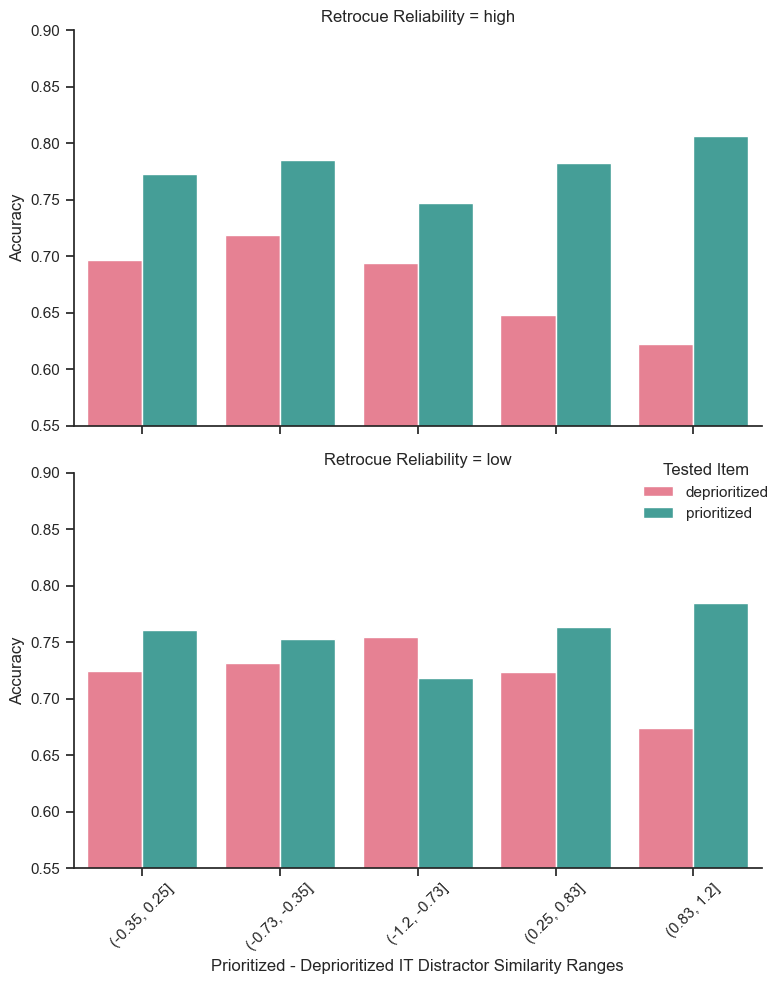

In [140]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Calculate the subject-level mean within each condition
subject_means = df.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# Step 2: Calculate the mean of these subject-level means for each condition
group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# Step 3: Plotting
# Create a bar plot with separate rows for high and low Retrocue Reliability, averaging across subject-level means
g = sns.catplot(
    x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
    y='Accuracy',
    hue='Tested Item',
    row='Retrocue Reliability',
    data=group_means,
    kind='bar',
    ci=68,            # Confidence interval
    dodge=True,       # Separate bars for each Tested Item
    aspect=1.3,
    palette=palette[::-1]
)

# Set the y-axis limit
g.set(ylim=(0.55, 0.9))

# Rotate the x-axis labels for readability
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Set axis labels
g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")
plt.tight_layout()
plt.show()


/var/folders/h_/pm5z54tn7rj170br8494ljz80000gn/T/ipykernel_85239/1896991467.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  g = sns.catplot(


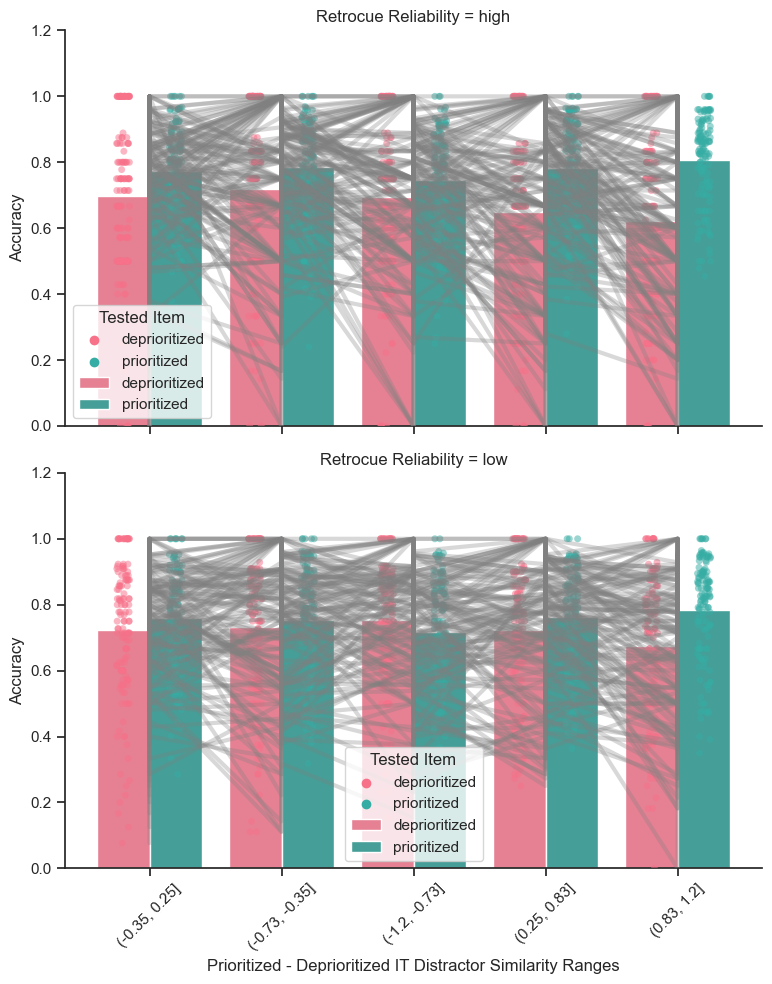

In [128]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Step 1: Normalize Accuracy values within each participant in the original dataset
# df['Accuracy'] = df.groupby('participant')['Accuracy'].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# # Step 2: Calculate the subject-level mean within each condition using the normalized Accuracy values
# subject_means = df.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# # Step 3: Calculate the mean of these subject-level normalized means for each condition
# group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()

# # Step 4: Plotting
# # Initialize the FacetGrid with separate rows for each level of Retrocue Reliability
# g = sns.catplot(
#     x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
#     y='Accuracy',
#     hue='Tested Item',
#     row='Retrocue Reliability',
#     data=group_means,
#     kind='bar',
#     ci=68,
#     dodge=True,
#     aspect=1.3,
#     palette=palette[::-1]
# )

# # Overlay the individual participant dots and connecting lines on each FacetGrid subplot
# for reliability, ax in zip(group_means['Retrocue Reliability'].unique(), g.axes.flat):
#     # Plot individual participant dots
#     sns.stripplot(
#         x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
#         y='Accuracy',
#         hue='Tested Item',
#         data=subject_means[subject_means['Retrocue Reliability'] == reliability],
#         dodge=True,
#         marker='o',
#         palette=palette[::-1],
#         ax=ax,
#         alpha=0.5,    # Set some transparency for better visualization
#         s=5           # Set the size of the dots
#     )
    
#     # Plot connecting lines for each participant
#     participants = subject_means['participant'].unique()
#     for participant in participants:
#         participant_data = subject_means[(subject_means['participant'] == participant) & (subject_means['Retrocue Reliability'] == reliability)]
#         if participant_data.shape[0] > 1:  # Ensure there are multiple points to connect
#             ax.plot(
#                 participant_data['Prioritized - Deprioritized IT Distractor Similarity Ranges'],
#                 participant_data['Accuracy'],
#                 color='gray',
#                 alpha=0.3,
#                 zorder=5
#             )

# # Set the y-axis limit and remove duplicate legends
# g.set(ylim=(0, 1.2))
# g._legend.remove()

# # Rotate the x-axis labels for readability
# for ax in g.axes.flat:
#     for label in ax.get_xticklabels():
#         label.set_rotation(45)

# # Set axis labels
# g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")
# plt.tight_layout()
# plt.show()


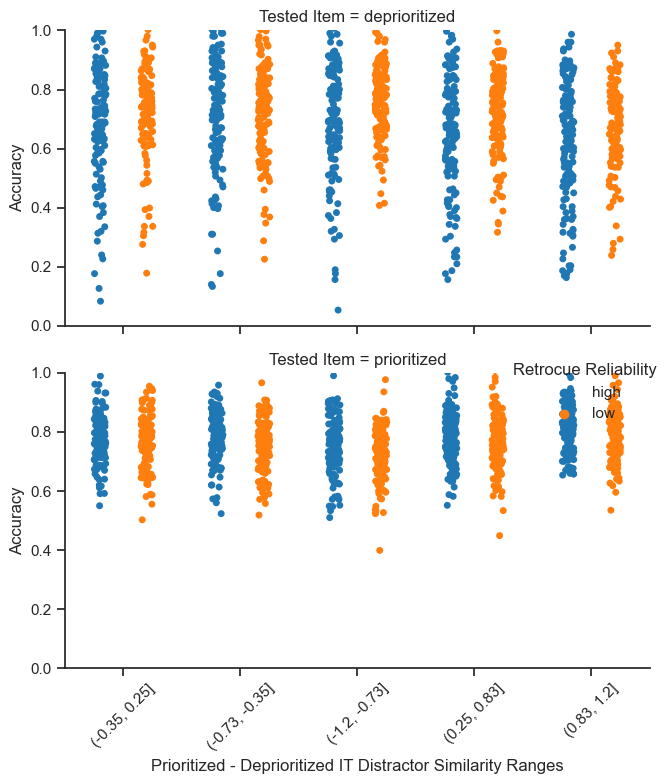

In [113]:
# palette_retrocue = {"high": "#1f77b4", "low": "#ff7f0e"}  # Blue for high, Orange for low

# # Create a FacetGrid to show separate rows for each level of Retrocue Reliability
# g = sns.catplot(
#     x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
#     y='Accuracy',
#     hue='Retrocue Reliability',
#     row='Tested Item',  # Separate rows for high and low reliability
#     data=subject_means,
#     kind='strip',
#     dodge=True,  # Jitter points side-by-side for different Tested Item values
#     palette=palette_retrocue,  # Use color differences for Retrocue Reliability
#     height=4,
#     aspect=1.3
# )

# # Customize y-axis limit and axis labels
# g.set(ylim=(0, 1))
# g.set_axis_labels("Prioritized - Deprioritized IT Distractor Similarity Ranges", "Accuracy")

# # Rotate x-axis labels for better readability
# for ax in g.axes.flat:
#     for label in ax.get_xticklabels():
#         label.set_rotation(45)

# plt.tight_layout()
# plt.show()

In [93]:
# # Convert 'Prioritized - Deprioritized IT Distractor Similarity Ranges' to string for plotting
# df['Prioritized - Deprioritized IT Distractor Similarity Ranges'] = df['Prioritized - Deprioritized IT Distractor Similarity Ranges'].astype(str)

# # Preparing the subject-level mean data
# subject_means = df.groupby(['participant', 'Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()
# group_means = subject_means.groupby(['Prioritized - Deprioritized IT Distractor Similarity Ranges', 'Tested Item'])['Accuracy'].mean().reset_index()

# # Define a color palette for "Retrocue Reliability" (high and low)
# # palette_retrocue = ["#1f77b4", "#ff7f0e"]  # Blue for high, Orange for low

# # Plotting
# fig, ax = plt.subplots(figsize=(16, 24))
# sns.set(style="ticks", rc={"lines.linewidth": 3})

# # Stripplot with "Retrocue Reliability" as hue to differentiate dots
# sns.stripplot(
#     x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
#     y='Accuracy',
#     data=subject_means,
#     hue='Retrocue Reliability',  # Use Retrocue Reliability as hue
#     palette=palette_retrocue,
#     marker="o",
#     jitter=True,
#     s=15,
#     zorder=10,
#     ax=ax
# )

# # Overlay the bar plot for the mean accuracy across subjects in each group
# sns.barplot(
#     x='Prioritized - Deprioritized IT Distractor Similarity Ranges',
#     y='Accuracy',
#     hue='Tested Item',
#     palette=palette[::-1],
#     data=group_means,
#     ax=ax,
#     alpha=0.6
# )

# # Clean up the legend to avoid duplicates
# handles, labels = ax.get_legend_handles_labels()
# by_label = dict(zip(labels, handles))
# ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

# # Customize axis and plot appearance
# ax.yaxis.set_major_locator(ticker.MultipleLocator(0.05))
# ax.set_ylim(0, 1)
# ax.set_xlabel("Prioritized - Deprioritized IT Distractor Similarity Ranges", fontsize=20)
# ax.set_ylabel("Accuracy", fontsize=20)
# ax.tick_params(axis='x', rotation=45, labelsize=15)
# ax.tick_params(axis='y', labelsize=15)

# fig.tight_layout(rect=[0, 0, 1, 1])  # Adjust rect to create space for the legend
# plt.show()


In [94]:
# # Preparing the subject-level mean data without Prioritized - Deprioritized IT Distractor Similarity Ranges
# subject_means = df.groupby(['participant', 'Tested Item', 'Retrocue Reliability'])['Accuracy'].mean().reset_index()
# group_means = subject_means.groupby(['Tested Item'])['Accuracy'].mean().reset_index()

# # Define a color palette for "Retrocue Reliability" (high and low) using blue and orange
# palette_retrocue = ["#1f77b4", "#ff7f0e"]  # Blue for high, Orange for low

# # Plotting
# fig, ax = plt.subplots(figsize=(16, 24))
# sns.set(style="ticks", rc={"lines.linewidth": 3})

# # Stripplot with "Retrocue Reliability" as hue to differentiate dots
# sns.stripplot(
#     x='Tested Item',  # Changed x-axis to Tested Item
#     y='Accuracy',
#     data=subject_means,
#     hue='Retrocue Reliability',  # Use Retrocue Reliability as hue
#     palette=palette_retrocue,
#     marker="o",
#     jitter=True,
#     s=15,
#     zorder=10,
#     ax=ax
# )

# # Overlay the bar plot for the mean accuracy across subjects in each group without hue
# sns.barplot(
#     x='Tested Item',  # Changed x-axis to Tested Item
#     y='Accuracy',
#     data=group_means,
#     ax=ax,
# #     color='gray'/,  # Single color for bar plot
#     alpha=0.6
# )

# # Clean up the legend to avoid duplicates
# handles, labels = ax.get_legend_handles_labels()
# by_label = dict(zip(labels, handles))
# ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

# # Customize axis and plot appearance
# ax.yaxis.set_major_locator(ticker.MultipleLocator(0.05))
# ax.set_ylim(0, 1)
# ax.set_xlabel("Tested Item", fontsize=20)  # Updated x-axis label
# ax.set_ylabel("Accuracy", fontsize=20)
# ax.tick_params(axis='x', rotation=45, labelsize=15)
# ax.tick_params(axis='y', labelsize=15)

# fig.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust rect to create space for the legend
# plt.show()


In [95]:
# df

In [96]:
# df.to_csv("df_stats5.csv", index=False)


In [97]:
# df['it_sim_dis_diff']= df['Prioritized - Deprioritized IT Distractor Similarity Ranges']

In [98]:
# md = smf.glm(
#     "resp_correct ~ it_sim_dis_diff*reliability*validity \
#         + v2_sim_dis_diff*reliability*validity",
#     data=df,
#     family=sm.families.Binomial()  
# ).fit()

# # View the summary
# md.summary()